In [1]:
################################################
#### Jingying Wang <astro.jywang@gmail.com> ####
###############################################
#imports
import katdal
import numpy as np
import matplotlib.pylab as plt
import astropy.coordinates as ac
import functools
import healpy as hp
import optparse
import warnings
from matplotlib.backends.backend_pdf import PdfPages
import healpy as hp
from astropy import units as u
from matplotlib.offsetbox import AnchoredText
import time
import pickle
import sys
Tcmb=2.725
import katcali
import katcali.visualizer as kv
import katcali.models as km
import katcali.rfi as kr
import katcali.solver as ks
import katcali.io as kio
import katcali.label_dump as kl
import katcali.diode as kd
import katcali.filter as kf                                                                                                                                                                                                                  
from astropy.coordinates import SkyCoord
from astropy import units as u

print (katcali.__version__)

2.1.0


In [2]:
import faulthandler
faulthandler.enable()

In [3]:
print (katdal.__version__)

0.20.1


In [4]:
print ('start @ ' + time.asctime(time.localtime(time.time())) +'#')


start @ Thu Nov 21 16:35:12 2024#


In [5]:
print  (plt.rcParams['font.size'], plt.rcParams[u'axes.linewidth'],plt.rcParams['lines.linewidth'])
plt.rcParams['font.size'], plt.rcParams[u'axes.linewidth'],plt.rcParams['lines.linewidth'] = 14, 1.5, 1.5
#plt.rcParams['font.size'], plt.rcParams[u'axes.linewidth'],plt.rcParams['lines.linewidth'] = 10.0, 0.8, 1.5
print  (plt.rcParams['font.size'], plt.rcParams[u'axes.linewidth'],plt.rcParams['lines.linewidth'])

10.0 0.8 1.5
14.0 1.5 1.5


In [6]:
#output_file="/scratch3/users/jywang/MeerKLASS2021/"
output_file="./"

In [7]:
fname='1675632179'#'1684087370'

data=kio.load_data(fname)
print (data)

Name: 1675632179_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: file:///idia/projects/hi_im/SCI-20220822-MS-01/1675632179/1675632179/1675632179_sdp_l0.full.rdb
Observer: Mario Santos  Experiment ID: 20230205-0015
Description: 'UHF HI intensity mapping desi 2 rising  no.1 offset=0'
Observed from 2023-02-05 23:23:25.164 SAST to 2023-02-06 02:06:58.031 SAST
Dump rate / period: 0.50077 Hz / 1.997 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m018,m019,m021,m022,m023,m024,m025,m026,m027,m028,m029,m030,m031,m032,m033,m034,m035,m037,m038,m039,m040,m041,m042,m043,m044,m045,m046,m047,m048,m049,m050,m051,m052,m053,m054,m055,m056,m057,m058,m059,m060,m061,m062,m063  122      244
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 UHF  c544M4k     816.000         544.000

In [8]:
data.obs_script_log

['2023-02-05 21:22:46.752Z INFO     ==========================',
 '2023-02-05 21:22:46.752Z INFO     New data capturing session',
 '2023-02-05 21:22:46.753Z INFO     --------------------------',
 "2023-02-05 21:22:46.753Z INFO     Session CBF = 'cbf' (1 fengine, 2 beamformers, 1 correlator)",
 '2023-02-05 21:22:46.753Z INFO     CBF instruments and streams:',
 "2023-02-05 21:22:46.753Z INFO       -> 'wide' (1 fengine, 2 beamformers, 1 correlator)",
 "2023-02-05 21:22:46.754Z INFO            -> fengine    'wide.antenna-channelised-voltage' (128 inputs)",
 "2023-02-05 21:22:46.754Z INFO            -> beamformer 'wide.tied-array-channelised-voltage.0y' (64 inputs)",
 "2023-02-05 21:22:46.754Z INFO            -> beamformer 'wide.tied-array-channelised-voltage.0x' (64 inputs)",
 "2023-02-05 21:22:46.754Z INFO            -> correlator 'wide.baseline-correlation-products' (128 inputs)",
 "2023-02-05 21:22:46.754Z INFO     Session SDP = 'sdp' (1 product)",
 '2023-02-05 21:22:46.755Z INFO     SD

In [9]:
target,c0,bad_ants,flux_model=kio.check_ants(fname)


calibrator: PictorA, ra,dec= 79d57m25.8149s, -45d46m43.7801s
bad_ants: []


In [10]:
ants_good=[]
for i in np.array(kio.ant_list(data)):
    if i not in bad_ants:
        ants_good.append(i)
    else:
        print (str(i) + ' is bad')
print (fname)
print (ants_good)

1675632179
['m000', 'm001', 'm002', 'm003', 'm004', 'm005', 'm006', 'm007', 'm008', 'm009', 'm010', 'm011', 'm012', 'm013', 'm014', 'm015', 'm016', 'm018', 'm019', 'm021', 'm022', 'm023', 'm024', 'm025', 'm026', 'm027', 'm028', 'm029', 'm030', 'm031', 'm032', 'm033', 'm034', 'm035', 'm037', 'm038', 'm039', 'm040', 'm041', 'm042', 'm043', 'm044', 'm045', 'm046', 'm047', 'm048', 'm049', 'm050', 'm051', 'm052', 'm053', 'm054', 'm055', 'm056', 'm057', 'm058', 'm059', 'm060', 'm061', 'm062', 'm063']


In [11]:
nd_on_time,nd_cycle,nd_set=kd.cal_nd_basic_para(fname)
print (nd_on_time,nd_cycle,nd_set)

0.584099237647 19.4699745882 1675632179.78


# Select ant and polarization, then load data in 

In [12]:
def ch_finder(frequency_in_MHz):
    f1=frequency_in_MHz
    freqs=data.freqs
    ch_1=np.where(freqs/1e6<f1)[0][-1]
    ch_2=np.where(freqs/1e6>f1)[0][0]
    print ('ch:',ch_1,ch_2)
    print ('freqs_MHz:',freqs[ch_1]/1e6,freqs[ch_2]/1e6)
    if abs(freqs[ch_1]/1e6-f1)<=abs(freqs[ch_2]/1e6-f1):
        return ch_1
    else: 
        return ch_2

In [13]:
ch_finder(1023)

ch: 3606 3607
freqs_MHz: 1022.921875 1023.0546875


3607

In [14]:
#select ant, polarization, and one channel to show data calibration
ant='m030'
pol='h'

ch_plot=3600#800


In [15]:
#load data, labels, and parameters
ch_ref=3600
data.select(ants=ant,pol=pol)
recv=ant+pol
corr_id=kio.cal_corr_id(data,recv)
assert(recv==data.corr_products[corr_id][0])
assert(recv==data.corr_products[corr_id][1])
print (corr_id,recv)

0 m030h


In [16]:
ra,dec,az,el=kio.load_coordinates(data)
timestamps,freqs=kio.load_tf(data)
dump_period=data.dump_period


In [17]:
vis,flags= kio.call_vis(fname,recv)
vis_backup=vis.copy()

vis=np.ma.array(vis_backup,mask=flags)

['m030h' 'm030h']


In [18]:
print ('# origin mask ratio of '+recv+': '+str(np.shape(np.where(vis.mask==True))[1]/np.shape(vis)[0]/np.shape(vis)[1]))

# origin mask ratio of m030h: 0.19287700598735755


In [19]:
ang_deg=kio.load_ang_deg(ra,dec,c0)
#p_radec=np.loadtxt('radio_source.txt')

In [20]:
dp_tt,dp_ss,dp_f,dp_w, dp_t,dp_s,dp_slew,dp_stop=kl.cal_dp_label(data,flags,ant,pol,ch_ref,ang_deg)

In [21]:
ra1=ra.copy()
#ra1[ra>180]-=360

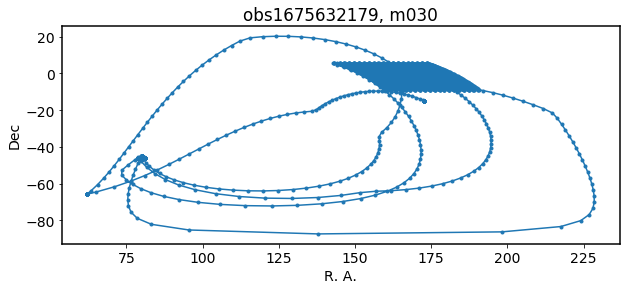

In [22]:
#show the scan route, typically track calibrator + scan sky + track calibrator 
plt.figure(figsize=(10,4))
plt.plot(ra1,dec,'.-')
#plt.plot(ra[dp_s],dec[dp_s],'g.')
#plt.plot(ra[dp_tt],dec[dp_tt],'m.')
plt.xlabel('R. A.')
plt.ylabel('Dec')
plt.title('obs'+str(fname)+', '+str(ant))
plt.show()

In [23]:
print (np.mean(ra),np.mean(ra1))
ra=ra1
print (np.mean(ra),np.mean(ra1))

153.09009927120485 153.09009927120485
153.09009927120485 153.09009927120485


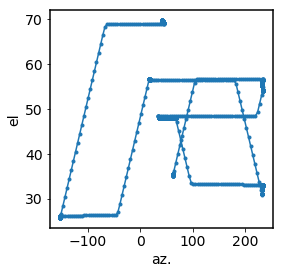

In [24]:
plt.figure(figsize=(4,4))
plt.plot(az,el,'.-')
plt.xlabel('az.')
plt.ylabel('el')
plt.show()

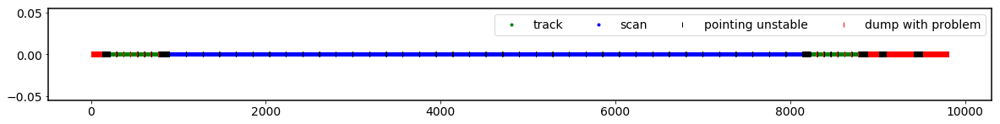

In [25]:
#show time dump label along the scan 
plt.figure(figsize=(20,2))
plt.plot(timestamps[dp_tt]-timestamps[0],np.zeros_like(dp_tt),'g.')
plt.plot(timestamps[dp_ss]-timestamps[0],np.zeros_like(dp_ss),'b.')
plt.plot(timestamps[dp_w]-timestamps[0],np.zeros_like(dp_w),'k|')
plt.plot(timestamps[dp_f]-timestamps[0],np.zeros_like(dp_f),'r|')
plt.legend(['track','scan','pointing unstable','dump with problem'],ncol=4)
plt.show()

In [26]:
print (np.shape(timestamps),np.shape(data.parangle))

(4914,) (4914, 1)


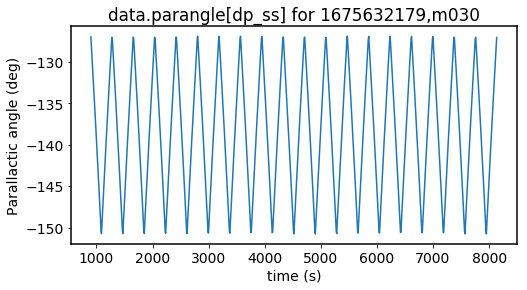

In [27]:
plt.figure(figsize=(8,4))
plt.plot(timestamps[dp_ss]-timestamps[0], data.parangle[dp_ss])
plt.title('data.parangle[dp_ss] for '+ fname+','+ant)
plt.xlabel('time (s)')
plt.ylabel('Parallactic angle (deg)')
plt.show()

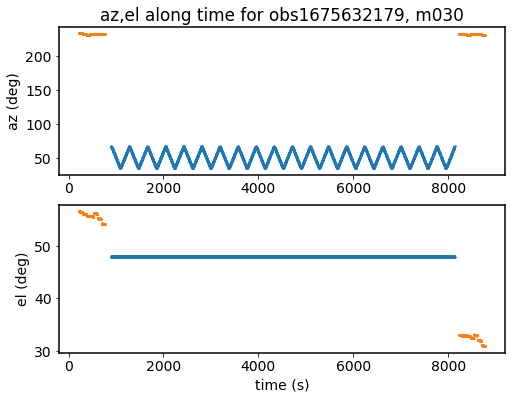

In [28]:
#show the az,el along time
plt.figure(figsize=(8,6))
plt.subplot(211)
if ant not in bad_ants:
    plt.plot(timestamps[dp_ss]-timestamps[0],az[dp_ss],'.',ms=3)
    plt.plot(timestamps[dp_tt]-timestamps[0],az[dp_tt],'.',ms=3)
#plt.ylim(az.min()-5,az.max()+5)
#plt.xlabel('time (s)')
plt.ylabel('az (deg)')
plt.title('az,el along time for obs'+str(fname)+', '+str(ant))
if fname=='1551055211':
    plt.title('azimuth and elevation against time')
#plt.legend(['scan','track'])
#plt.text(0, -15, 'track-I',color='C1')
#plt.text(6300, -35, 'track-II',color='C1')
#plt.text(3300, -35, 'scan',color='C0')
plt.subplot(212)
if ant not in bad_ants:
    plt.plot(timestamps[dp_ss]-timestamps[0],el[dp_ss],'.',ms=3)
    plt.plot(timestamps[dp_tt]-timestamps[0],el[dp_tt],'.',ms=3)
#plt.ylim(el.min()-2,el.max()+2)
plt.xlabel('time (s)')
plt.ylabel('el (deg)')
#plt.text(0, 54, 'track-I',color='C1')
#plt.text(6300, 44.5, 'track-II',color='C1')
#plt.text(3300, 44.5, 'scan',color='C0')
#plt.savefig(output_file+'F_'+str(fname)+'_'+str(ant)+'_azel.pdf',  bbox_inches='tight')
plt.show()

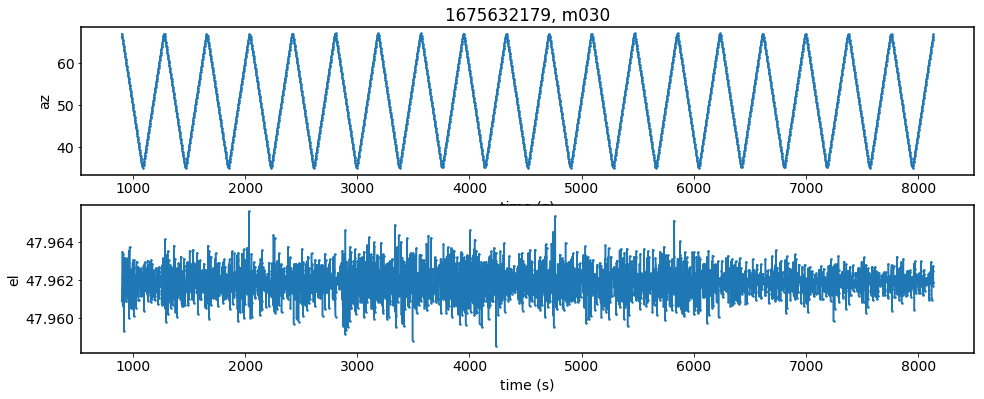

In [29]:
#az,el for scan part, which are expected to be stable
plt.figure(figsize=(16,6))
plt.subplot(211)
if ant not in bad_ants:
    plt.plot(timestamps[dp_ss]-timestamps[0],az[dp_ss],'.-',ms=3)
plt.xlabel('time (s)')
plt.ylabel('az')
plt.title(str(fname)+', '+str(ant))
plt.subplot(212)
if ant not in bad_ants:
    plt.plot(timestamps[dp_ss]-timestamps[0],el[dp_ss],'.-',ms=3)
plt.xlabel('time (s)')
plt.ylabel('el')
#plt.savefig(output_file+str(fname)+'_'+str(ant)+'_azel.pdf')
plt.show()

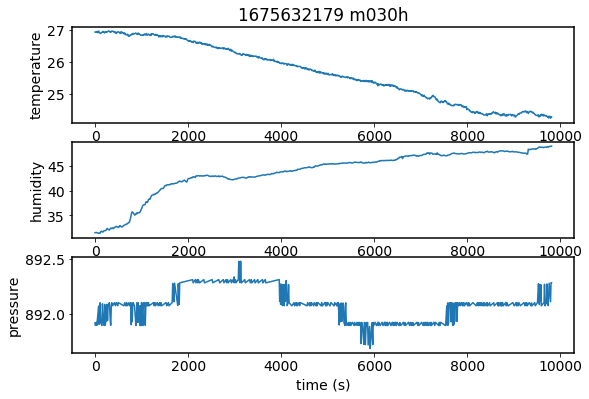

In [30]:
plt.figure(figsize=(9,6))
plt.subplot(311)
plt.plot(timestamps-timestamps[0],data.temperature)
#plt.xlabel('time (s)')
plt.ylabel('temperature')
plt.title(fname+' '+recv)
plt.subplot(312)
plt.plot(timestamps-timestamps[0],data.humidity)
#plt.xlabel('time (s)')
plt.ylabel('humidity')
plt.subplot(313)
plt.plot(timestamps-timestamps[0],data.pressure)
plt.xlabel('time (s)')
plt.ylabel('pressure')
plt.show()


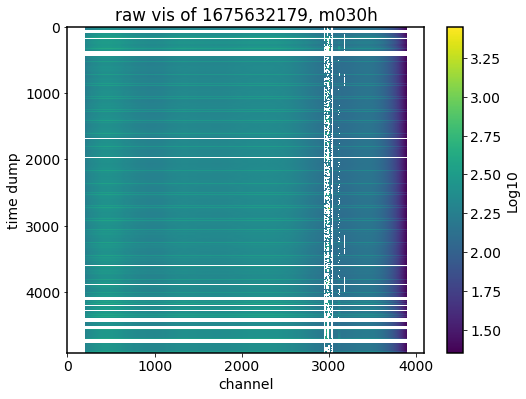

In [31]:
#raw visibility
plt.figure(figsize=(8,6))
plt.imshow(np.ma.log10(vis),aspect='auto')
plt.ylabel('time dump')
plt.xlabel('channel')
plt.title('raw vis of '+str(fname)+', '+str(recv))
plt.colorbar(label='Log10')
#plt.savefig(output_file+str(fname)+'_'+str(recv)+'_raw_vis.pdf')
plt.show()

In [32]:
nd_on_edge,nd_off_edge=kd.cal_nd_edges(timestamps,nd_set,nd_cycle,nd_on_time)
print (len(nd_on_edge),len(nd_off_edge))

edge number 0-505
506 506


In [33]:
vis1=vis[:,ch_plot]
plt_ymin=vis1.min()
plt_ymax=vis1.max()

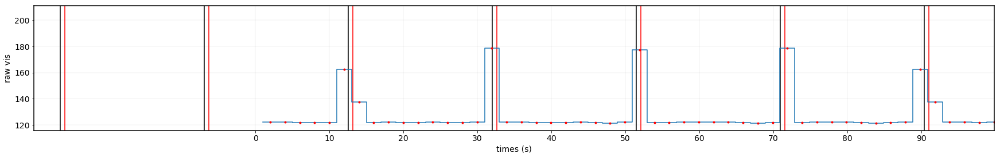

x-axis is time (s)


In [34]:
plt.figure(figsize=(30,4))
plt.plot([nd_on_edge-timestamps[0],nd_on_edge-timestamps[0]],[plt_ymin,plt_ymax],'k-')  
plt.plot([nd_off_edge-timestamps[0],nd_off_edge-timestamps[0]],[plt_ymin,plt_ymax],'r-')  

plt.step(timestamps-timestamps[0],vis1,'-',where='mid')
plt.plot(timestamps[dp_t]-timestamps[0],vis1[dp_t],'r.')
plt.plot(timestamps[dp_s]-timestamps[0],vis1[dp_s],'m.')
plt.plot(timestamps[dp_stop]-timestamps[0],vis1[dp_stop],'g.')
plt.plot(timestamps[dp_slew]-timestamps[0],vis1[dp_slew],'y.')

plt.xticks(np.arange(0, timestamps[-1]-timestamps[0], 10))
plt.xlim(-10, timestamps[-1]-timestamps[0]+10)
plt.grid(color='grey',lw=.1)
plt.xlabel('times (s)')
plt.ylabel('raw vis')
plt.xlim(-30,timestamps[50]-timestamps[0])
plt.ylim(plt_ymin,plt_ymax)

plt.show()

print ('x-axis is time (s)')

In [35]:
nd_ratio,nd_0, nd_1x=kd.cal_nd_ratio(timestamps, nd_on_time, nd_on_edge, dump_period)

*** diode 0 was fired out of timestamps list: -26.38239049911499 not in [0,9810.870271921158]
*** diode 1 was fired out of timestamps list: -6.912415981292725 not in [0,9810.870271921158]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)


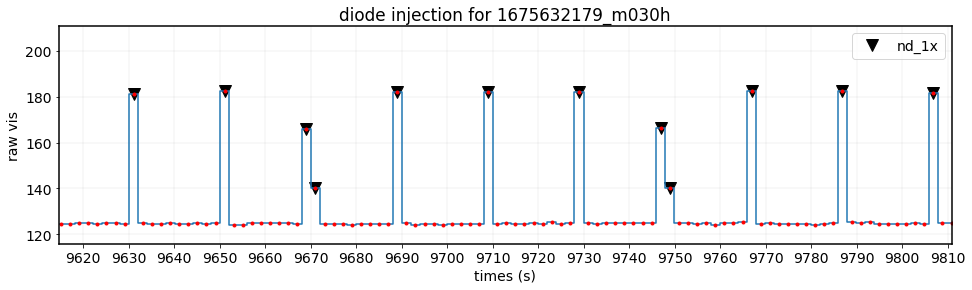

x-axis is time (s)


In [36]:
plt.figure(figsize=(16,4))
plt.plot(timestamps[nd_1x]-timestamps[0],vis1[nd_1x],'kv',ms=12,zorder=-1)
plt.step(timestamps-timestamps[0],vis1,'-',where='mid')
plt.plot(timestamps[dp_t]-timestamps[0],vis1[dp_t],'r.')
plt.plot(timestamps[dp_s]-timestamps[0],vis1[dp_s],'m.')
plt.plot(timestamps[dp_stop]-timestamps[0],vis1[dp_stop],'g.')
plt.plot(timestamps[dp_slew]-timestamps[0],vis1[dp_slew],'y.')

plt.xticks(np.arange(0, timestamps[-1]-timestamps[0], 10))
plt.xlim(-10, timestamps[-1]-timestamps[0]+10)
plt.grid(color='grey',lw=.1)
plt.xlabel('times (s)')
plt.ylabel('raw vis')
plt.xlim((timestamps[-1]-timestamps[0])*.98,timestamps[-1]-timestamps[0])
plt.ylim(plt_ymin,plt_ymax)
plt.legend(['nd_1x'],ncol=3)
plt.title('diode injection for '+str(fname)+'_'+str(recv))
plt.show()
print ('x-axis is time (s)')

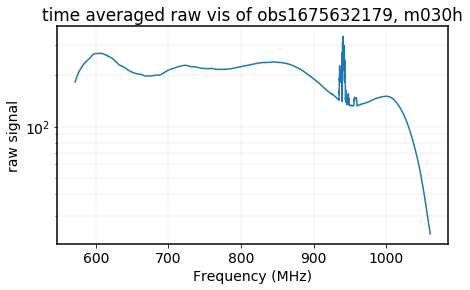

In [37]:
##time mean raw vis to show the bandpass
plt.figure(figsize=(7,4))
plt.plot(freqs/1e6,np.mean(vis[nd_0,:],axis=0))
plt.xlabel('Frequency (MHz)')
plt.ylabel('raw signal')
plt.yscale('log')
plt.title('time averaged raw vis of obs'+str(fname)+', '+str(recv))
if fname=='1551055211':
    plt.title('time averaged raw signal')
plt.grid(color='grey',which='both', lw=.1)
#plt.savefig(output_file+'F_band_mean_'+str(fname)+'_'+str(recv)+'.pdf', bbox_inches='tight')
plt.show()

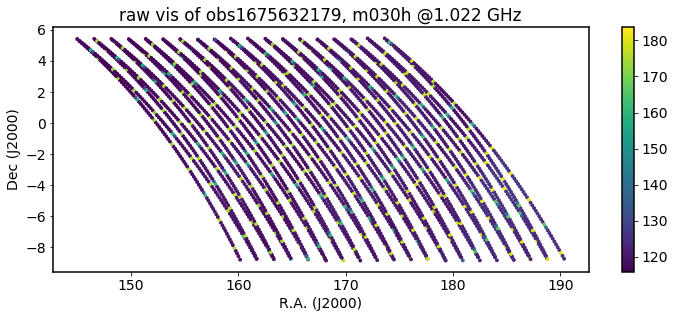

In [38]:
#raw vis map to check diode injection power and period
p_data=vis[dp_ss,ch_plot]
plt.figure(figsize=(12,4.5))
plt.scatter(ra[dp_ss],dec[dp_ss], c=p_data, vmin=np.min(p_data),vmax=np.max(p_data), s=8)
plt.colorbar()
plt.title('raw vis of obs'+str(fname)+', '+str(recv)+ ' @'+ str(round(freqs[ch_plot]/1e9,3)) +' GHz')
plt.xlabel('R.A. (J2000)')
plt.ylabel('Dec (J2000)')
#plt.savefig(output_file+'F_'+str(fname)+'_'+str(recv)+'_map_scan.pdf', bbox_inches='tight')
plt.show()

In [39]:
nd_t0,nd_t1x,nd_s0,nd_s1x,nd_t0_ca,nd_t0_cb,nd_t1x_ca,nd_t1x_cb=kl.cal_label_intersec(dp_tt,dp_ss,nd_0,nd_1x)
print (len(nd_t0),len(nd_t0_ca),len(nd_t0_cb))
print (len(nd_t1x),len(nd_t1x_ca),len(nd_t1x_cb))
print (len(nd_s0),len(nd_s1x))


420 206 214
62 34 28
3064 451


In [40]:
labels_1x=kl.cal_label_intersec_complex(dp_tt,dp_ss,nd_0,nd_1x,nd_ratio)

[0.0, 0.08096, 0.21154, 0.2925]
# nd ratio number in total: 4
ratio1 0.08096: 105 7 91 7
ratio2 0.21154: 104 7 90 7
ratio3 0.2925: 304 20 270 14
# total label groups for nd_1x: 9


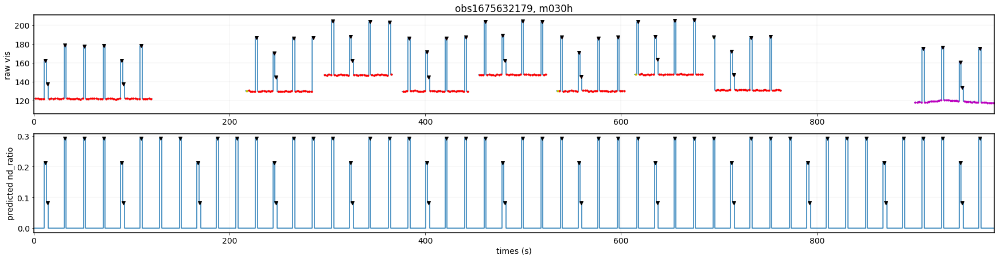

x-axis is time (s)


In [41]:
x_min=(timestamps[-1]-timestamps[0])*.0
x_max=(timestamps[-1]-timestamps[0])*.1

plt.figure(figsize=(30,7))
plt.subplot(211)
plt.step(timestamps-timestamps[0],vis1,'-',where='mid')
plt.plot(timestamps[dp_t]-timestamps[0],vis1[dp_t],'r.')
plt.plot(timestamps[dp_s]-timestamps[0],vis1[dp_s],'m.')
plt.plot(timestamps[dp_stop]-timestamps[0],vis1[dp_stop],'g.')
plt.plot(timestamps[dp_slew]-timestamps[0],vis1[dp_slew],'y.')
plt.plot(timestamps[nd_1x]-timestamps[0],vis1[nd_1x],'kv')
#plt.xticks(np.arange(0, timestamps[-1]-timestamps[0], 10))
plt.grid(color='grey',lw=.1)
#plt.xlabel('times (s)')
plt.ylabel('raw vis')
plt.xlim(x_min,x_max)
plt.ylim(plt_ymin-10,plt_ymax)
plt.title('obs'+fname+', '+recv)
plt.subplot(212)
plt.step(timestamps-timestamps[0],nd_ratio,'-',where='mid')
plt.plot(timestamps[nd_1x]-timestamps[0],nd_ratio[nd_1x],'kv')
#plt.xticks(np.arange(0, timestamps[-1]-timestamps[0], 10))
plt.grid(color='grey',lw=.1)
plt.xlabel('times (s)')
plt.ylabel('predicted nd_ratio')
plt.xlim(x_min,x_max)
plt.show()

print ('x-axis is time (s)')

In [42]:
dp_sb=dp_ss[0]
dp_se=dp_ss[-1]

p_radec0=np.loadtxt('radio_source_fsky.txt')


In [43]:
p_radec=[]
fov_expand=3.
for i in range(np.shape(p_radec0)[0]):
    if (p_radec0[i,0]>ra[dp_ss].min()-fov_expand and p_radec0[i,0]<ra[dp_ss].max()+fov_expand and 
    p_radec0[i,1]>dec[dp_ss].min()-fov_expand and p_radec0[i,1]<dec[dp_ss].max()+fov_expand): 
        p_radec.append(p_radec0[i,:])
p_radec=np.array(p_radec)

In [44]:
print(np.shape(p_radec0), np.shape(p_radec))

(3683, 2) (80, 2)


In [45]:
p = SkyCoord(data.ra*u.deg,  data.dec*u.deg, frame='icrs')
ang_lim=.5

dp_ptr_list=kl.cal_ptr_mask(p,p_radec,nd_s0, dp_sb,dp_se,ang_lim)


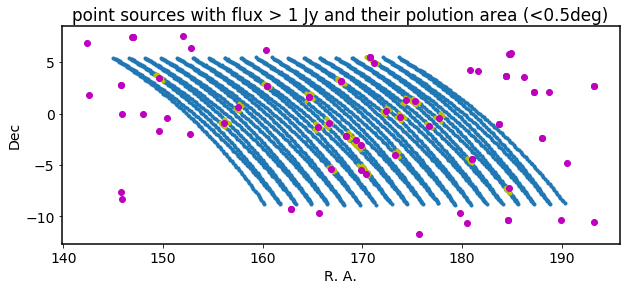

In [46]:
#show the scan route, typically track calibrator + scan sky + track calibrator 
plt.figure(figsize=(10,4))
plt.plot(ra[dp_ss],dec[dp_ss],'.-')
plt.plot(ra[dp_ptr_list],dec[dp_ptr_list],'y.')
plt.plot(p_radec[:,0],p_radec[:,1],'mo')
plt.xlabel('R. A.')
plt.ylabel('Dec')
#plt.xlim(-30,1)
#plt.ylim(-37,-24)
plt.title('point sources with flux > 1 Jy and their polution area (<'+str(ang_lim)+'deg)')
plt.show()


<class 'numpy.ma.core.MaskedArray'>


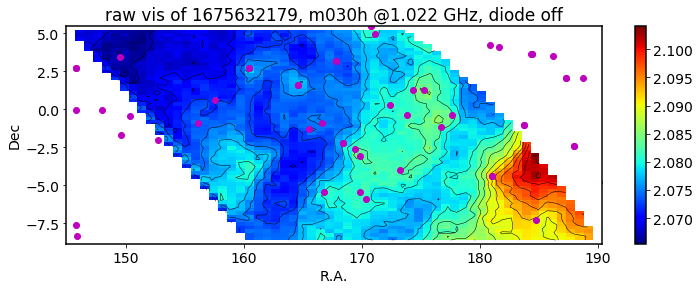

In [47]:
#interpolation map to show the raw vis data vis point sources (magenta dots)
p_data=np.ma.log10(vis[nd_s0,ch_plot])
plt.figure(figsize=(12,4))
kv.plot_data(ra[nd_s0],dec[nd_s0], p_data,gsize=60)
plt.title('raw vis of '+str(fname)+', '+str(recv)+ ' @'+ str(round(freqs[ch_plot]/1e9,3)) +' GHz, diode off')
plt.xlabel('R.A.')
plt.ylabel('Dec')
plt.plot(p_radec[:,0],p_radec[:,1],'mo')
plt.show()

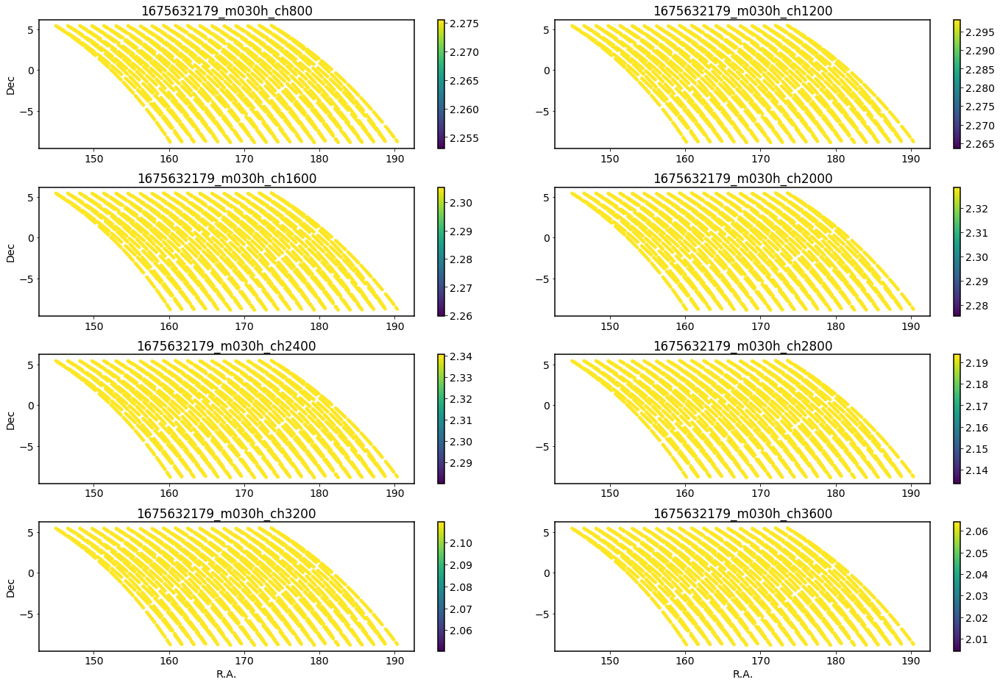

In [48]:
ch_plot_list=[800,1200,1600,2000,2400,2800,3200,3600]
plt.figure(figsize=(24,20))
plt.subplots_adjust(wspace=0.1,hspace=0.3)
for i in range(len(ch_plot_list)):
    ch_plot1=ch_plot_list[i]
    p_data=np.ma.log10(vis[nd_s0,ch_plot1])
    plt.subplot(5,2,i+1)
    plt.scatter(ra[nd_s0],dec[nd_s0], c=p_data, vmin=p_data.min(),vmax=p_data.max()/1.05, s=14)
    if i>len(ch_plot_list)-3:
        plt.xlabel('R.A.')
    if i%2==0:
        plt.ylabel('Dec')
    plt.colorbar()
    plt.title(fname+'_'+recv+'_ch'+str(ch_plot1))
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
#plt.savefig(output_file+fname+'_'+recv+'_scatter_map0.png')
plt.show()

<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>


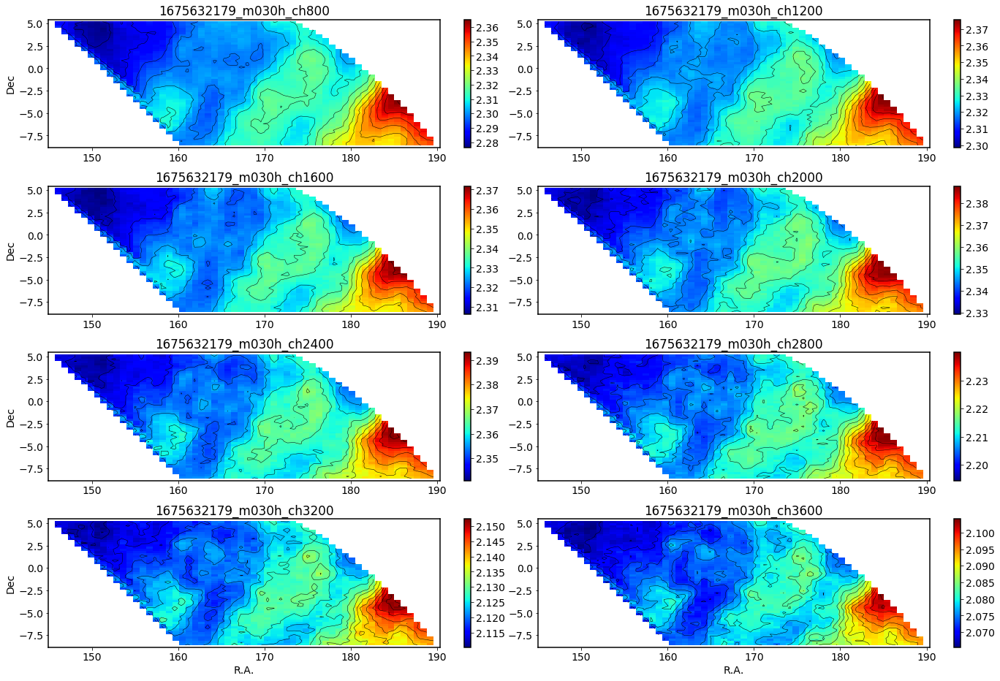

In [49]:
plt.figure(figsize=(24,20))
plt.subplots_adjust(wspace=0,hspace=0.3)
for i in range(len(ch_plot_list)):
    ch_plot1=ch_plot_list[i]
    p_data=np.ma.log10(vis[nd_s0,ch_plot1])
    plt.subplot(5,2,i+1)
    kv.plot_data(ra[nd_s0],dec[nd_s0], p_data,gsize=60)
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
    if i>len(ch_plot_list)-3:
        plt.xlabel('R.A.')
    if i%2==0:
        plt.ylabel('Dec')
    plt.title(fname+'_'+recv+'_ch'+str(ch_plot1))
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
#plt.savefig(output_file+fname+'_'+recv+'_map0.png')
plt.show()

# RFI flagging

## Basic RFI flagging (all channels)

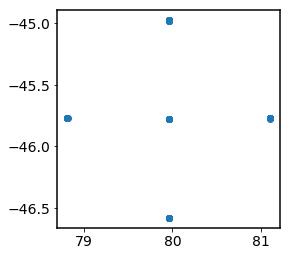

In [50]:
plt.figure(figsize=(4,4))
plt.plot(ra[dp_tt],dec[dp_tt],'o')
plt.show()

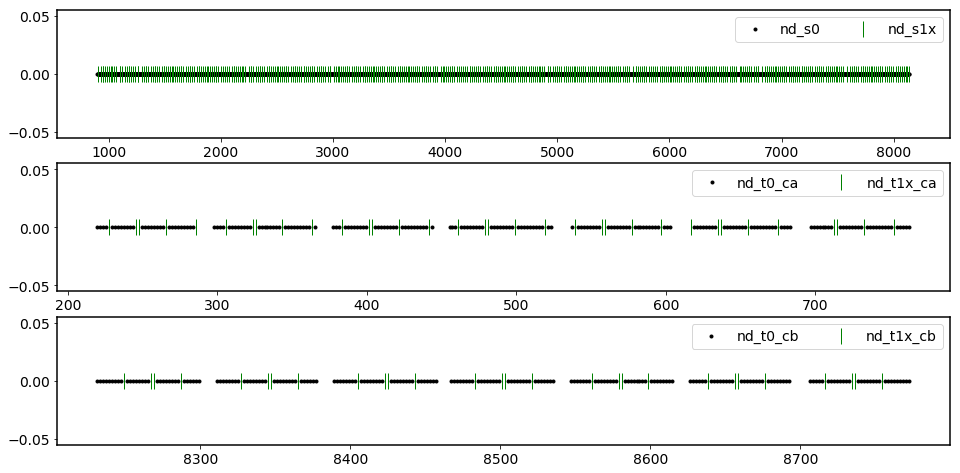

In [51]:
plt.figure(figsize=(16,8))
plt.subplot(311)
plt.plot(timestamps[nd_s0]-timestamps[0],np.zeros_like(timestamps[nd_s0]),'k.')
plt.plot(timestamps[nd_s1x]-timestamps[0],np.zeros_like(timestamps[nd_s1x]),'g|',ms=16)
plt.legend(['nd_s0','nd_s1x'],ncol=4)
plt.subplot(312)
plt.plot(timestamps[nd_t0_ca]-timestamps[0],np.zeros_like(timestamps[nd_t0_ca]),'k.')
plt.plot(timestamps[nd_t1x_ca]-timestamps[0],np.zeros_like(timestamps[nd_t1x_ca]),'g|',ms=16)
plt.legend(['nd_t0_ca','nd_t1x_ca'],ncol=4)
plt.subplot(313)
plt.plot(timestamps[nd_t0_cb]-timestamps[0],np.zeros_like(timestamps[nd_t0_cb]),'k.')
plt.plot(timestamps[nd_t1x_cb]-timestamps[0],np.zeros_like(timestamps[nd_t1x_cb]),'g|',ms=16)
plt.legend(['nd_t0_cb','nd_t1x_cb'],ncol=4)
plt.show()


In [52]:
dp_tt,dp_ss,dp_f,dp_w, dp_t,dp_s,dp_slew,dp_stop=kl.cal_dp_label(data,flags,ant,pol,ch_ref,ang_deg)
nd_ratio,nd_0, nd_1x=kd.cal_nd_ratio(timestamps, nd_on_time, nd_on_edge, dump_period)
nd_t0,nd_t1x,nd_s0,nd_s1x,nd_t0_ca,nd_t0_cb,nd_t1x_ca,nd_t1x_cb=kl.cal_label_intersec(dp_tt,dp_ss,nd_0,nd_1x)
labels_1x=kl.cal_label_intersec_complex(dp_tt,dp_ss,nd_0,nd_1x,nd_ratio)

*** diode 0 was fired out of timestamps list: -26.38239049911499 not in [0,9810.870271921158]
*** diode 1 was fired out of timestamps list: -6.912415981292725 not in [0,9810.870271921158]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)
[0.0, 0.08096, 0.21154, 0.2925]
# nd ratio number in total: 4
ratio1 0.08096: 105 7 91 7
ratio2 0.21154: 104 7 90 7
ratio3 0.2925: 304 20 270 14
# total label groups for nd_1x: 9


In [53]:
flag_step=1
Threshold_factor1, Threshold_factor2=5,3 #diode off, on

*** diode 0 was fired out of timestamps list: -26.38239049911499 not in [0,9810.870271921158]
*** diode 1 was fired out of timestamps list: -6.912415981292725 not in [0,9810.870271921158]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)
[0.0, 0.08096, 0.21154, 0.2925]
# nd ratio number in total: 4
ratio1 0.08096: 105 7 91 7
ratio2 0.21154: 104 7 90 7
ratio3 0.2925: 304 20 270 14
# total label groups for nd_1x: 9
group number in total: 12
### load flags ###
### RFI flagging for full vis ### 
data.flags ratio:
0.19287700598735755
### mask data not track/scan ###
### SEEK flagging ###
flag_step: 1
group 0, dp num 7
data shape is (7, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 88.6791483561198
RFI flagging applied on group0
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.27


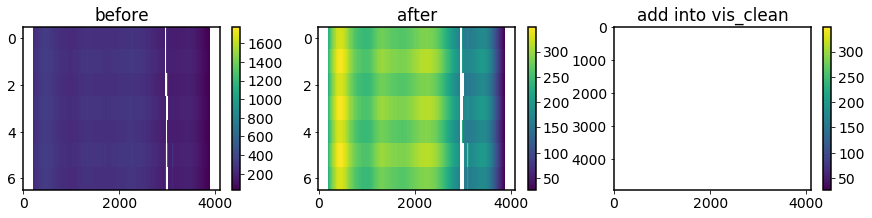

group 1, dp num 91
data shape is (91, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 76.88423919677734
RFI flagging applied on group1
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.26


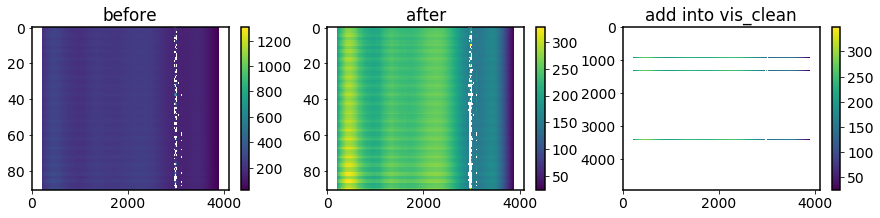

group 2, dp num 7
data shape is (7, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 90.11639912923177
RFI flagging applied on group2
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.27


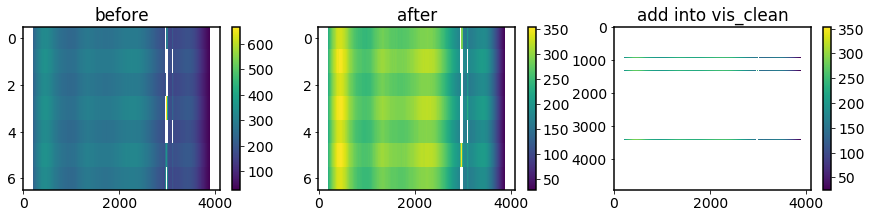

group 3, dp num 7
data shape is (7, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 100.88736470540364
RFI flagging applied on group3
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.26


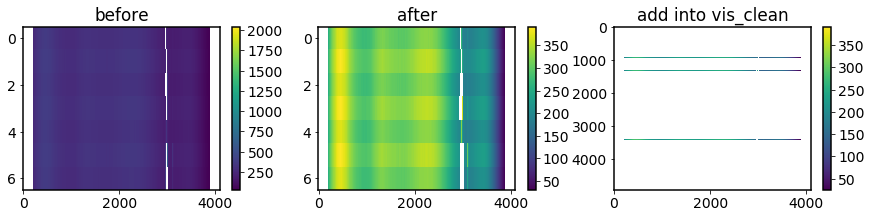

group 4, dp num 90
data shape is (90, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 89.1456298828125
RFI flagging applied on group4
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.26


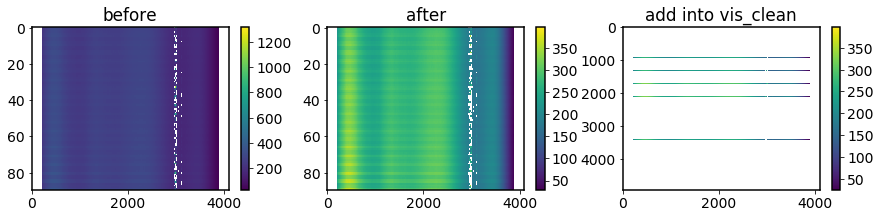

group 5, dp num 7
data shape is (7, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 102.42515563964844
RFI flagging applied on group5
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.26


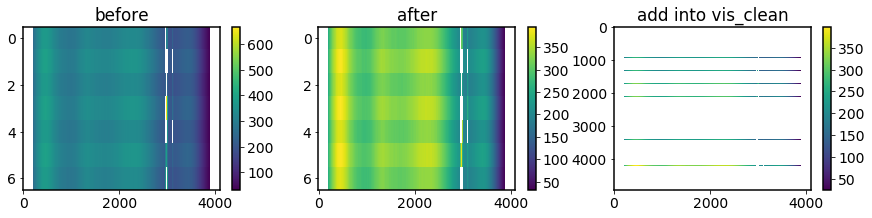

group 6, dp num 20
data shape is (20, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 108.4134012858073
RFI flagging applied on group6
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.26


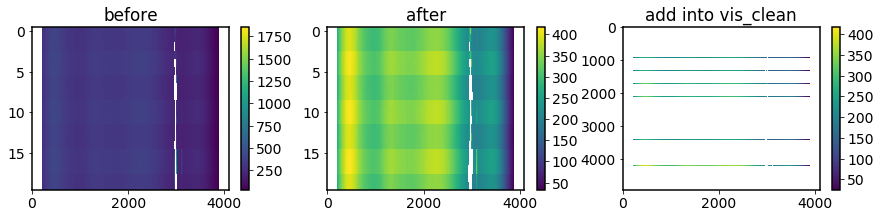

group 7, dp num 270
data shape is (270, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 96.45233154296875
RFI flagging applied on group7
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.25


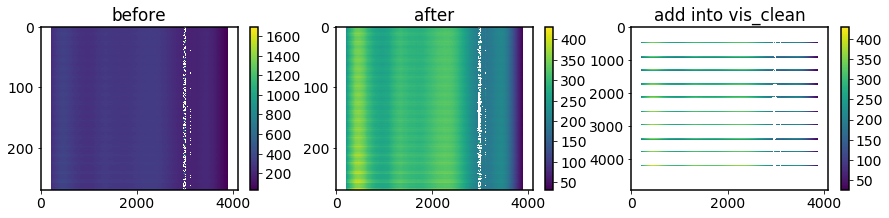

group 8, dp num 14
data shape is (14, 4096)
Threshold_factor2=3 applied on nd_1x
Threshold_local is 109.88760375976562
RFI flagging applied on group8
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (1, 20)
Std/Mean of the non-masked elements of tod is 0.26


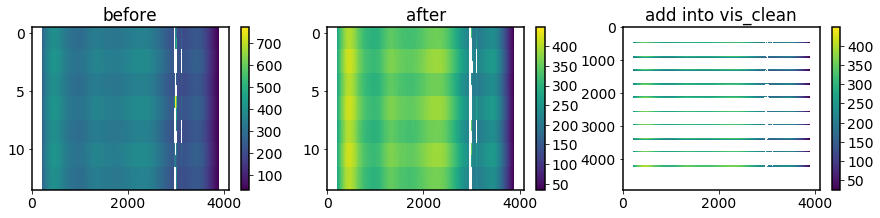

group 9, dp num 206
data shape is (206, 4096)
Threshold_factor1=2.5 applied on nd_t0
Threshold_local is 97.61529846191407
RFI flagging applied on group9
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (20, 20)
Std/Mean of the non-masked elements of tod is 0.28


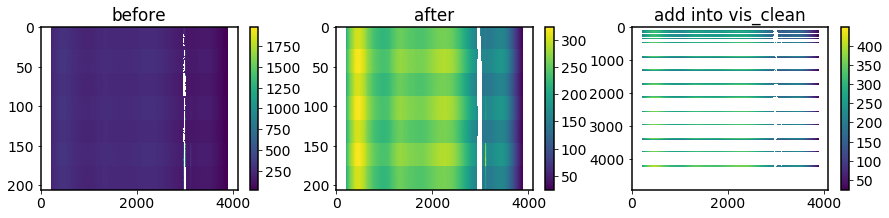

group 10, dp num 3064
data shape is (3064, 4096)
Threshold_factor1=5 applied on nd_s0
Threshold_local is 41.64091491699219
RFI flagging applied on group10
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (20, 20)
Std/Mean of the non-masked elements of tod is 0.27


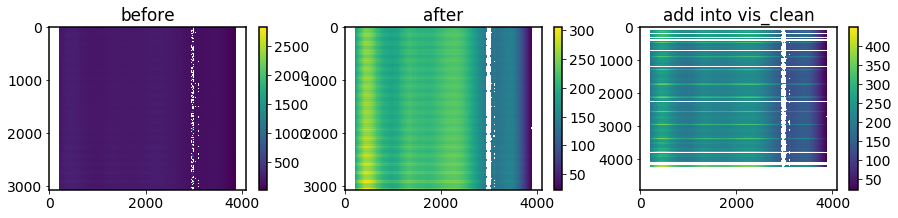

group 11, dp num 214
data shape is (214, 4096)
Threshold_factor1=2.5 applied on nd_t0
Threshold_local is 99.15692749023438
RFI flagging applied on group11
------------------------------------------
sm_kwargs_para: (60, 50, 30, 25)
di_kwargs_para: (20, 20)
Std/Mean of the non-masked elements of tod is 0.27


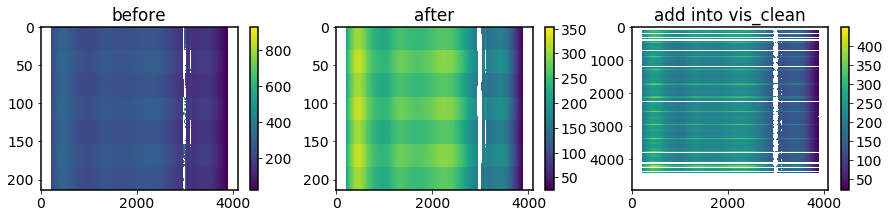

#checking neighbours
#cleaning the bad ratio part
# all dp_tt and dp_ss checked


In [54]:
#rfi flagging for raw vis data
#vis_clean=kr.vis_flag(vis_backup,flags,nd_label0, dp_w, First_Thresholds)
vis_clean=kr.vis_flag_v2(data, flags, ch_ref, ant,pol,vis_backup,timestamps, nd_on_time, nd_on_edge, dump_period, ang_deg, flag_step, Threshold_factor1, Threshold_factor2, ratio_clean_key=0, plt_key=0)

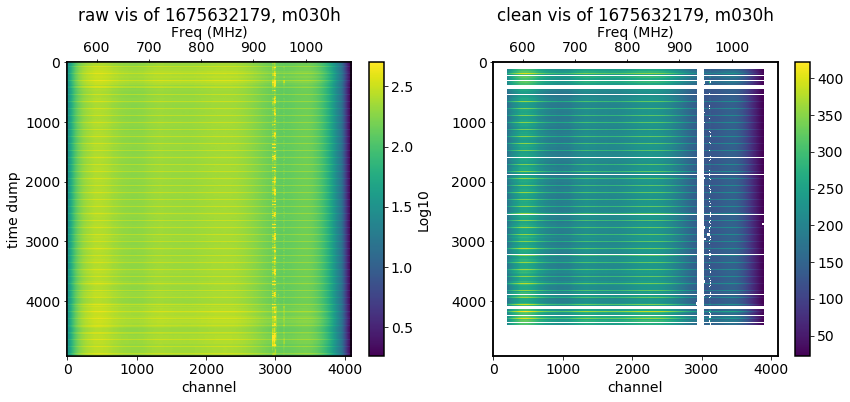

In [55]:
#compare vis before and after rfi flagging

plt.figure(figsize=(14,5.4))
plt.subplot(121)
plt.imshow(np.ma.log10(vis_backup),aspect='auto',vmax=2.7)
plt.ylabel('time dump')
plt.xlabel('channel')
plt.title('raw vis of '+str(fname)+', '+str(recv), y=1.12)
plt.colorbar(label='Log10')
plt.twiny()
plt.imshow(np.ma.log10(vis_backup),aspect='auto',extent=(data.freqs[0]/1e6,data.freqs[-1]/1e6,len(timestamps),0),vmax=2.7)
plt.xlabel('Freq (MHz)')
plt.subplot(122)
plt.imshow(vis_clean,aspect='auto')
#plt.ylabel('time dump')
plt.xlabel('channel')
plt.title('clean vis of '+str(fname)+', '+str(recv), y=1.12)
plt.colorbar()
plt.twiny()
plt.imshow(vis_clean,aspect='auto',extent=(data.freqs[0]/1e6,data.freqs[-1]/1e6,len(timestamps),0))
plt.xlabel('Freq (MHz)')
#plt.savefig(str(fname)+'raw_vis.pdf', bbox_inches='tight')
#plt.savefig(output_file+str(fname)+'_'+recv+'_raw_vis.png', bbox_inches='tight')
plt.show()

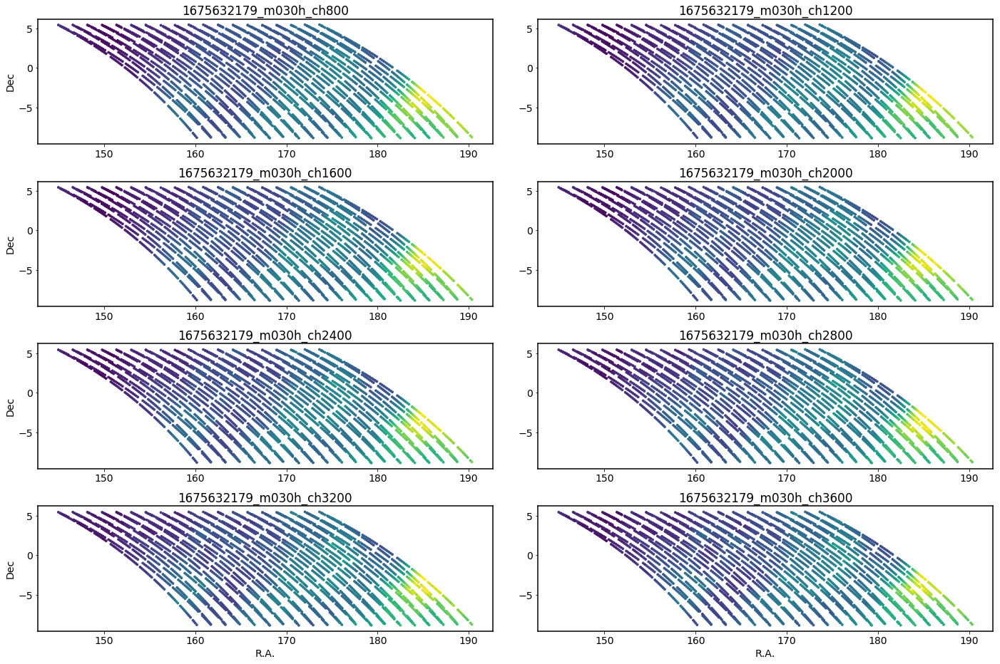

In [56]:
plt.figure(figsize=(24,20))
plt.subplots_adjust(wspace=0.1,hspace=0.3)
for i in range(len(ch_plot_list)):
    ch_plot1=ch_plot_list[i]
    p_data=vis_clean[nd_s0,ch_plot1]
    plt.subplot(5,2,i+1)
    plt.scatter(ra[nd_s0],dec[nd_s0], c=p_data, vmin=p_data.min(),vmax=p_data.max(), s=8)
    if i>len(ch_plot_list)-3:
        plt.xlabel('R.A.')
    if i%2==0:
        plt.ylabel('Dec')
    plt.title(fname+'_'+recv+'_ch'+str(ch_plot1))
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
#plt.savefig(output_file+fname+'_'+recv+'_scatter_map1.png')
plt.show()

<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>


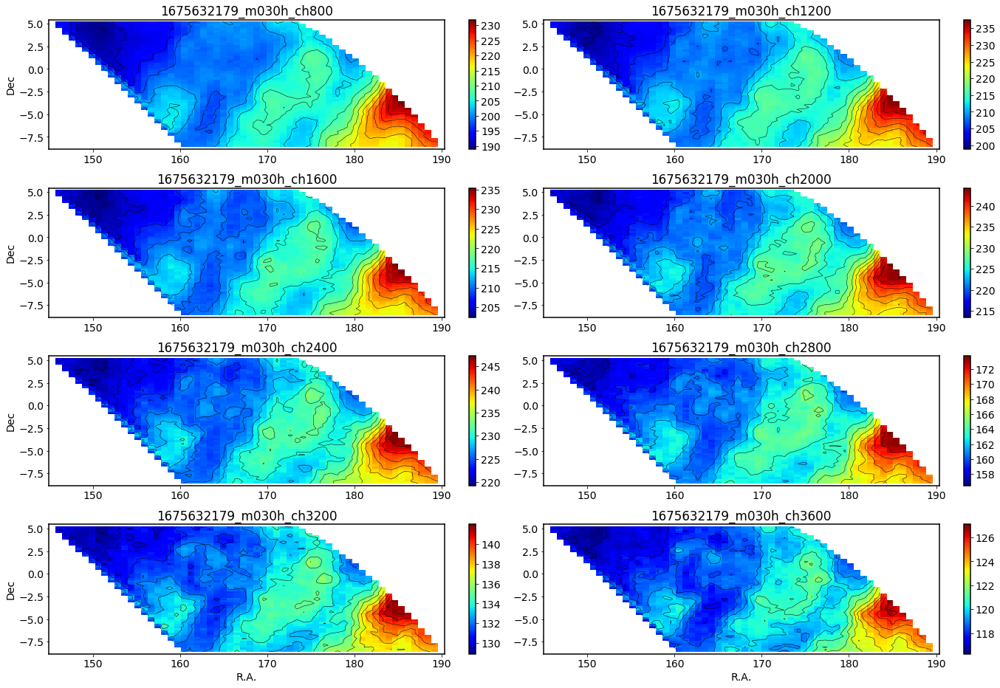

In [57]:
plt.figure(figsize=(24,20))
plt.subplots_adjust(wspace=0,hspace=0.3)
for i in range(len(ch_plot_list)):
    ch_plot1=ch_plot_list[i]
    p_data=vis_clean[nd_s0,ch_plot1]
    plt.subplot(5,2,i+1)
    kv.plot_data(ra[nd_s0],dec[nd_s0], p_data,gsize=60)
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
    if i>len(ch_plot_list)-3:
        plt.xlabel('R.A.')
    if i%2==0:
        plt.ylabel('Dec')
    plt.title(fname+'_'+recv+'_ch'+str(ch_plot1))
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
#plt.savefig(output_file+fname+'_'+recv+'_map1.png')
plt.show()

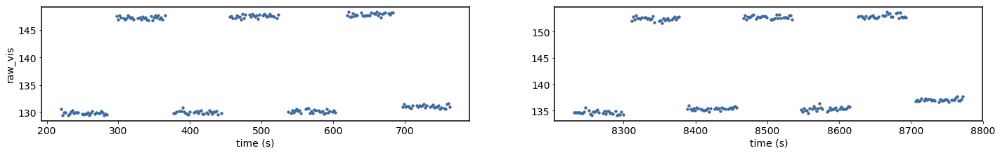

In [58]:
plt.figure(figsize=(24,3))
plt.subplot(121)
plt.plot(timestamps[nd_t0_ca]-timestamps[0],vis[nd_t0_ca,ch_plot],'r.')
plt.plot(timestamps[nd_t0_ca]-timestamps[0],vis_clean[nd_t0_ca,ch_plot],'.')
plt.xlabel('time (s)')
plt.ylabel('raw_vis')
plt.subplot(122)
plt.plot(timestamps[nd_t0_cb]-timestamps[0],vis[nd_t0_cb,ch_plot],'r.')
plt.plot(timestamps[nd_t0_cb]-timestamps[0],vis_clean[nd_t0_cb,ch_plot],'.')
plt.xlabel('time (s)')
plt.show()

In [59]:
###second rfi

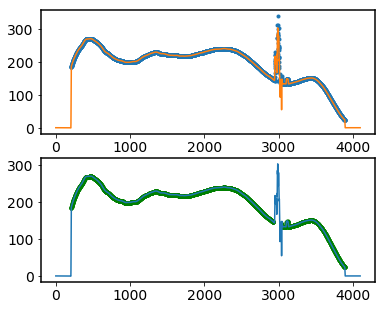

In [60]:
from scipy.interpolate import Rbf
rbf = Rbf(range(4096) ,np.ma.mean(vis[nd_0,:],axis=0), smooth=1) #vis has no mask, flags hasn't applied.
cur=rbf(range(4096))

plt.figure(figsize=(6,5))
plt.subplot(211)
plt.plot(np.mean(vis[nd_0,:],axis=0),'.')
plt.plot(cur)
plt.subplot(212)
plt.plot(np.mean(vis_clean[nd_0,:],axis=0),'g.')
plt.plot(cur)
plt.show()

In [61]:
vis_clean2=vis_clean.copy()
for ch_i in range(4096):
    vis_clean2[:,ch_i]=vis_clean2[:,ch_i]/cur[ch_i] #rescaled!!!
print (vis_clean2.mean())

1.035596086511855


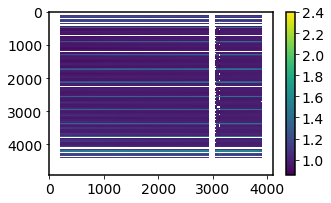

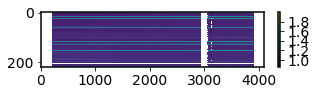

In [62]:
vis_clean2_part1=vis_clean2

plt.figure(figsize=(5,3))
plt.imshow(vis_clean2_part1,aspect='auto')
plt.colorbar()
plt.show()
#'''
plt.figure(figsize=(5,1))
plt.imshow(vis_clean2_part1[dp_ptr_list,:],aspect='auto')
plt.colorbar()
plt.show()
#'''

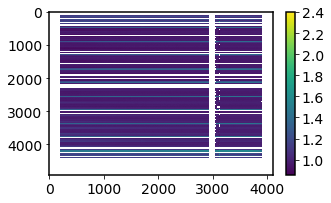

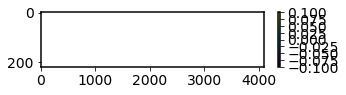

In [63]:
#'''
vis_clean2_part1.mask[dp_ptr_list,:]=True

plt.figure(figsize=(5,3))
plt.imshow(vis_clean2_part1,aspect='auto')
plt.colorbar()
plt.show()
plt.figure(figsize=(5,1))
plt.imshow(vis_clean2_part1[dp_ptr_list,:],aspect='auto')
plt.colorbar()
plt.show()
#'''

In [64]:
flag_step=2
Threshold_factor11,Threshold_factor22=1.05,1. #diode off, on

*** diode 0 was fired out of timestamps list: -26.38239049911499 not in [0,9810.870271921158]
*** diode 1 was fired out of timestamps list: -6.912415981292725 not in [0,9810.870271921158]
# checked: len(nd_0)+len(nd_1x)==len(timestamps)
[0.0, 0.08096, 0.21154, 0.2925]
# nd ratio number in total: 4
ratio1 0.08096: 105 7 91 7
ratio2 0.21154: 104 7 90 7
ratio3 0.2925: 304 20 270 14
# total label groups for nd_1x: 9
group number in total: 12
### load flags ###
### RFI flagging for full vis ### 
data.flags ratio:
0.2018065710692664
### mask data not track/scan ###
### SEEK flagging ###
flag_step: 2
group 0, dp num 7
data shape is (7, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.2289948016701975
RFI flagging applied on group0
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.04


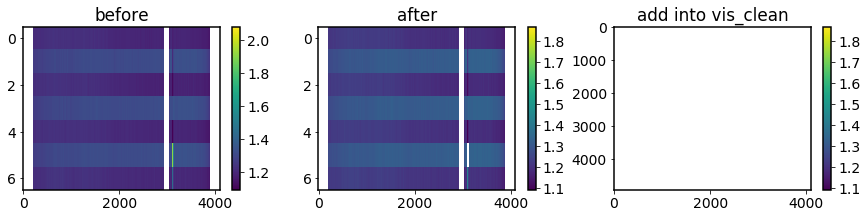

group 1, dp num 91
data shape is (91, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.0818080675901152
RFI flagging applied on group1
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.03


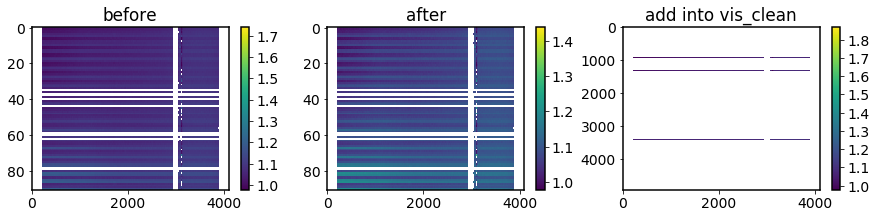

group 2, dp num 7
data shape is (7, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.2458816865249611
RFI flagging applied on group2
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.04


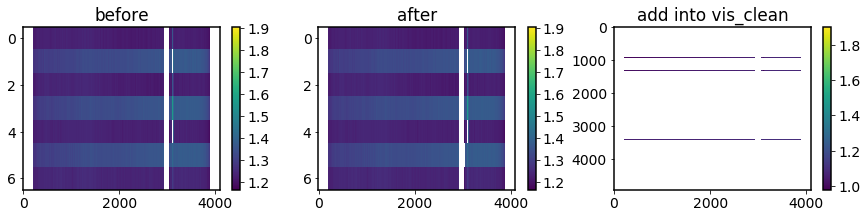

group 3, dp num 7
data shape is (7, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.4010048530304493
RFI flagging applied on group3
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.04


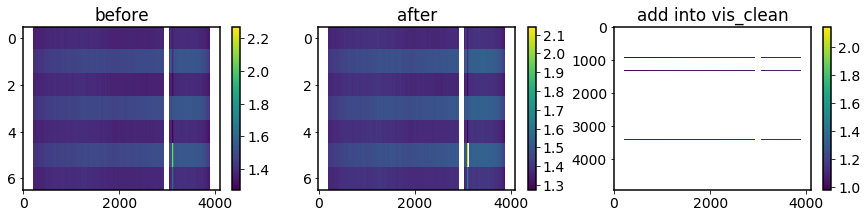

group 4, dp num 90
data shape is (90, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.2572428325624756
RFI flagging applied on group4
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.03


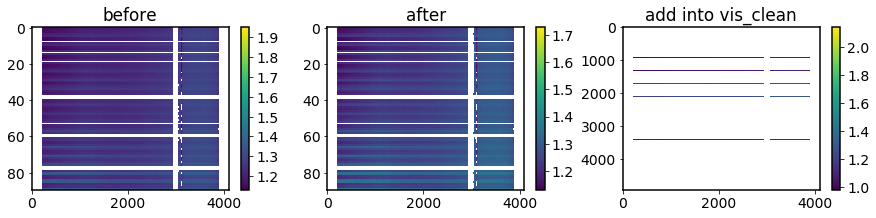

group 5, dp num 7
data shape is (7, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.4347634913041736
RFI flagging applied on group5
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.04


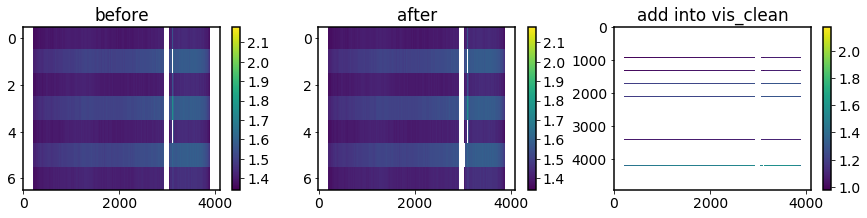

group 6, dp num 20
data shape is (20, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.5188912456814698
RFI flagging applied on group6
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.04


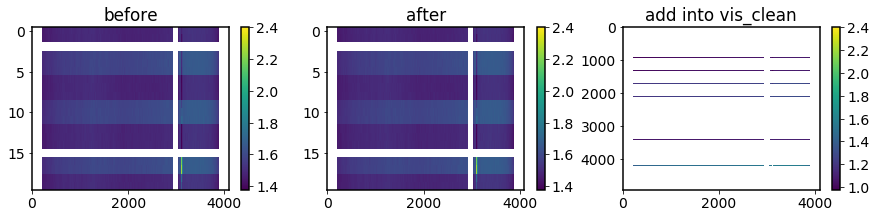

group 7, dp num 270
data shape is (270, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.3608721036506182
RFI flagging applied on group7
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.04


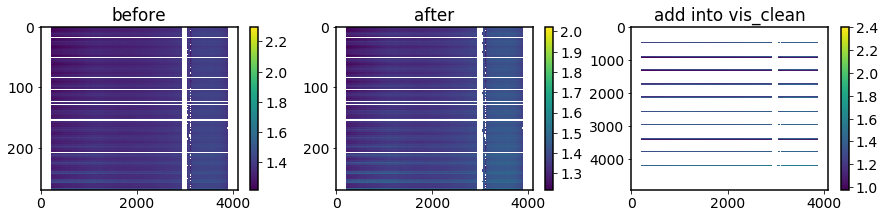

group 8, dp num 14
data shape is (14, 4096)
Threshold_factor2=1.0 applied on nd_1x
Threshold_local is 1.552752683701672
RFI flagging applied on group8
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (1, 10)
Std/Mean of the non-masked elements of tod is 0.04


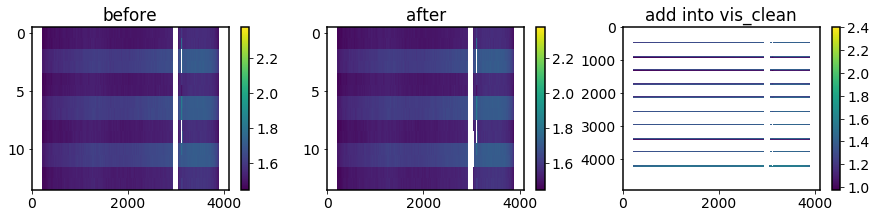

group 9, dp num 206
data shape is (206, 4096)
Threshold_factor1=0.525 applied on nd_t0
Threshold_local is 2.152594476267802
RFI flagging applied on group9
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (5, 10)
Std/Mean of the non-masked elements of tod is 0.05


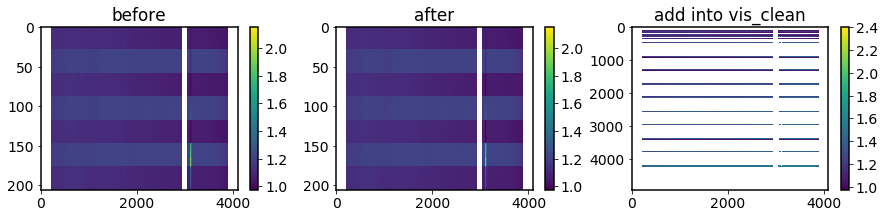

group 10, dp num 3064
data shape is (3064, 4096)
Threshold_factor1=1.05 applied on nd_s0
Threshold_local is 0.9239678766275858
RFI flagging applied on group10
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (5, 10)
Std/Mean of the non-masked elements of tod is 0.03


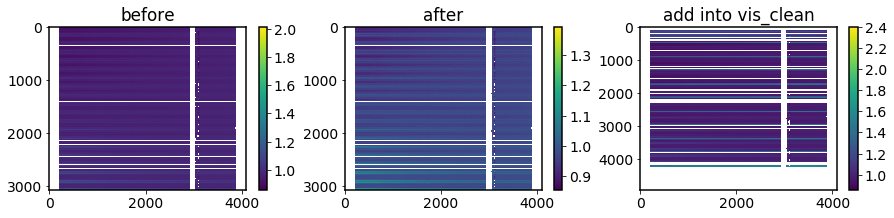

group 11, dp num 214
data shape is (214, 4096)
Threshold_factor1=0.525 applied on nd_t0
Threshold_local is 2.176672324349803
RFI flagging applied on group11
------------------------------------------
sm_kwargs_para: (40, 20, 20, 10)
di_kwargs_para: (5, 10)
Std/Mean of the non-masked elements of tod is 0.05


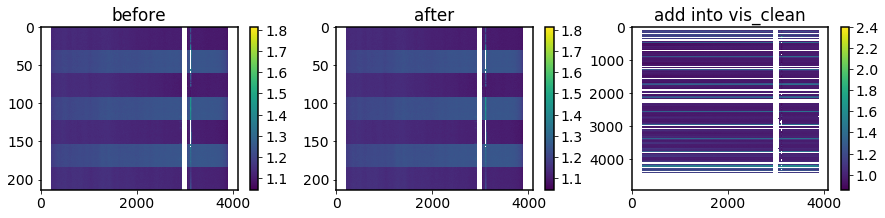

#checking neighbours
#cleaning the bad ratio part
# all dp_tt and dp_ss checked


In [65]:
#rfi flagging for raw vis data
vis_clean2_part1=kr.vis_flag_v2(data, flags, ch_ref, ant,pol,vis_clean2_part1, timestamps, nd_on_time, nd_on_edge, dump_period, ang_deg, flag_step, Threshold_factor11, Threshold_factor22, ratio_clean_key=0, plt_key=0)


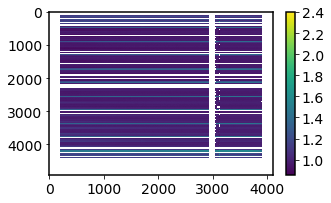

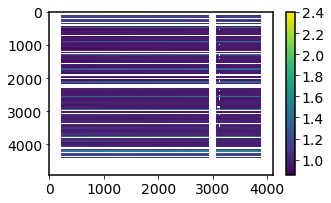

In [66]:
plt.figure(figsize=(5,3))
plt.imshow(vis_clean2,aspect='auto')
plt.colorbar()
plt.show()
plt.figure(figsize=(5,3))
plt.imshow(vis_clean2_part1,aspect='auto')
plt.colorbar()
plt.show()

In [67]:
vis_clean2=vis_clean.copy() #reset vis_clean2
vis_clean2.mask=vis_clean2_part1.mask
vis_clean2.mask[dp_ptr_list,:]=vis_clean.mask[dp_ptr_list,:]

vis_clean2=kr.clean_bad_ratio(vis_clean2)


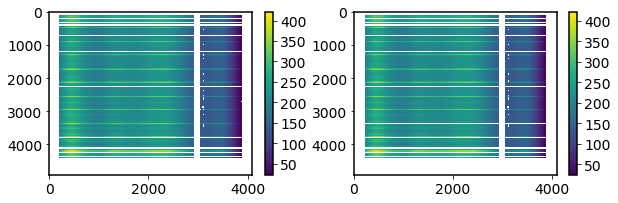

In [68]:
plt.figure(figsize=(10,3))
plt.subplot(121)
plt.imshow(vis_clean,aspect='auto')
plt.colorbar()
plt.subplot(122)
plt.imshow(vis_clean2,aspect='auto')
plt.colorbar()
plt.show()

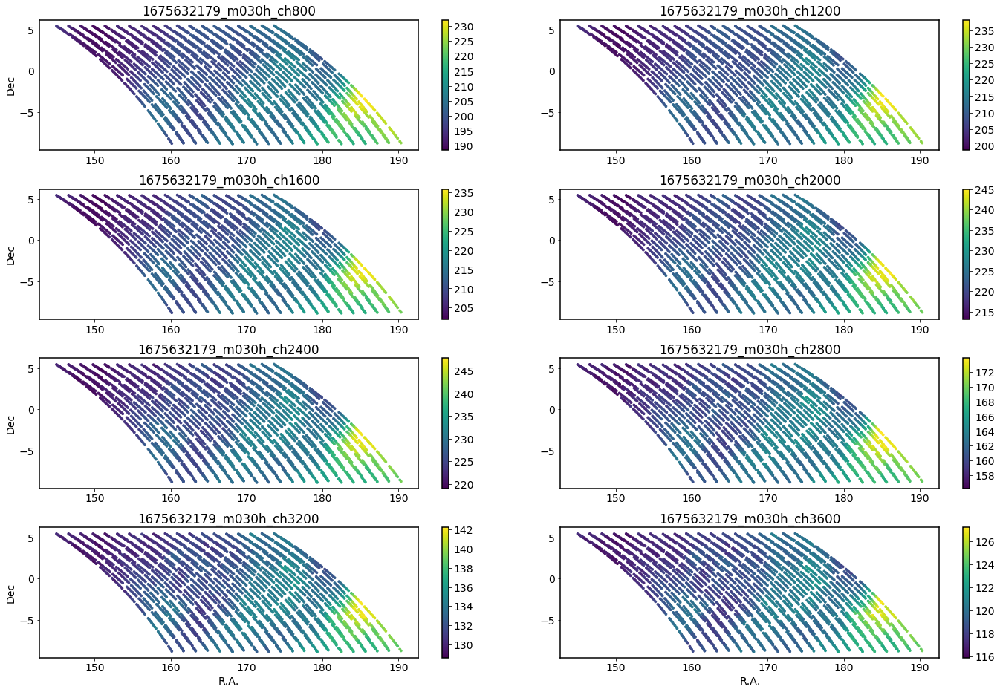

In [69]:
plt.figure(figsize=(24,20))
plt.subplots_adjust(wspace=0.1,hspace=0.3)
for i in range(len(ch_plot_list)):
    ch_plot1=ch_plot_list[i]
    p_data=vis_clean2[nd_s0,ch_plot1]
    plt.subplot(5,2,i+1)
    plt.scatter(ra[nd_s0],dec[nd_s0], c=p_data, vmin=p_data.min(),vmax=p_data.max(), s=8)
    if i>len(ch_plot_list)-3:
        plt.xlabel('R.A.')
    if i%2==0:
        plt.ylabel('Dec')
    plt.title(fname+'_'+recv+'_ch'+str(ch_plot1))
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
    #plt.xlim(-30,1)
    #plt.ylim(-37,-24)
    plt.colorbar()
#plt.savefig(output_file+fname+'_'+recv+'_scatter_map2.png')
plt.show()

<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>


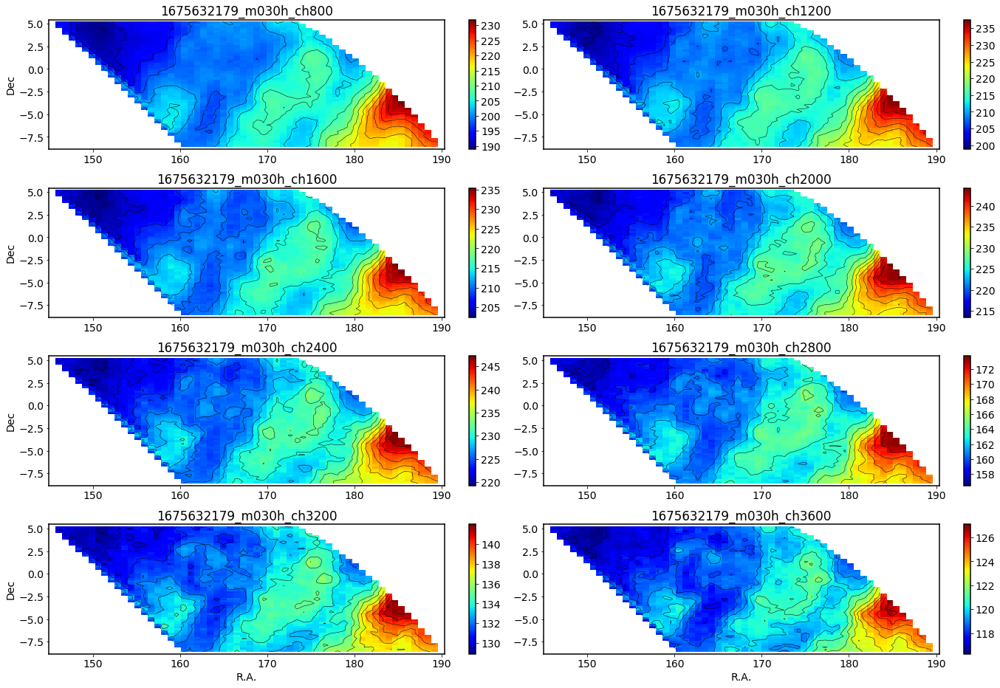

In [70]:
plt.figure(figsize=(24,20))
plt.subplots_adjust(wspace=0,hspace=0.3)
for i in range(len(ch_plot_list)):
    ch_plot1=ch_plot_list[i]
    p_data=vis_clean2[nd_s0,ch_plot1]
    plt.subplot(5,2,i+1)
    kv.plot_data(ra[nd_s0],dec[nd_s0], p_data,gsize=60)
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
    if i>len(ch_plot_list)-3:
        plt.xlabel('R.A.')
    if i%2==0:
        plt.ylabel('Dec')
    plt.title(fname+'_'+recv+'_ch'+str(ch_plot1))
    #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
    #plt.xlim(-30,1)
    #plt.ylim(-37,-24)
#plt.savefig(output_file+fname+'_'+recv+'_map2.png')
plt.show()

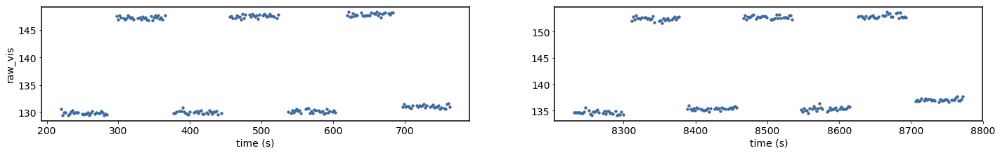

In [71]:
plt.figure(figsize=(24,3))
plt.subplot(121)
plt.plot(timestamps[nd_t0_ca]-timestamps[0],vis[nd_t0_ca,ch_plot],'r.')
plt.plot(timestamps[nd_t0_ca]-timestamps[0],vis_clean2[nd_t0_ca,ch_plot],'.')
plt.xlabel('time (s)')
plt.ylabel('raw_vis')
plt.subplot(122)
plt.plot(timestamps[nd_t0_cb]-timestamps[0],vis[nd_t0_cb,ch_plot],'r.')
plt.plot(timestamps[nd_t0_cb]-timestamps[0],vis_clean2[nd_t0_cb,ch_plot],'.')
plt.xlabel('time (s)')
plt.show()

In [72]:
vis_clean=vis_clean2.copy() #update vis_clean

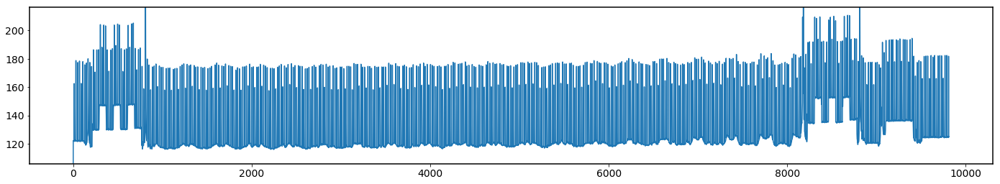

In [73]:
plt.figure(figsize=(24,4))
plt.plot(timestamps-timestamps[0],vis_backup[:,ch_plot])
plt.ylim(np.ma.min(vis_clean[nd_s0,ch_plot]-10),np.ma.max(vis_clean[nd_s0,ch_plot])*1.7)
plt.show()

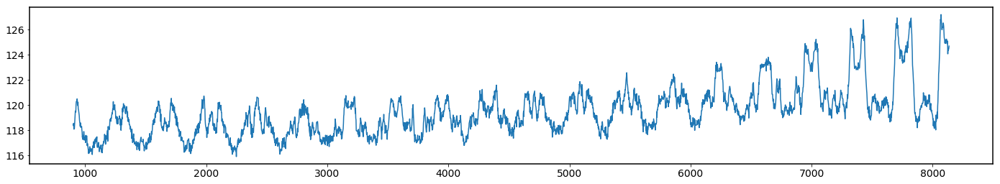

In [74]:
plt.figure(figsize=(24,4))
plt.plot(timestamps[nd_s0]-timestamps[0],vis_clean[nd_s0,ch_plot])
plt.show()

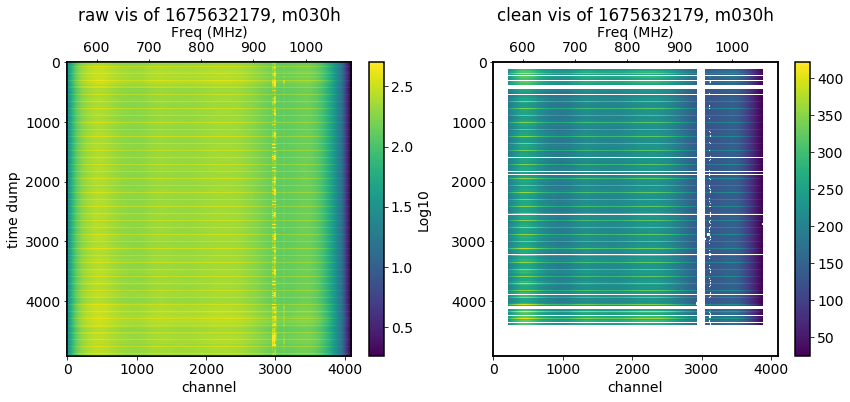

In [75]:
#compare vis before and after rfi flagging

plt.figure(figsize=(14,5.4))
plt.subplot(121)
plt.imshow(np.ma.log10(vis_backup),aspect='auto',vmax=2.7)
plt.ylabel('time dump')
plt.xlabel('channel')
plt.title('raw vis of '+str(fname)+', '+str(recv), y=1.12)
plt.colorbar(label='Log10')
plt.twiny()
plt.imshow(np.ma.log10(vis_backup),aspect='auto',extent=(data.freqs[0]/1e6,data.freqs[-1]/1e6,len(timestamps),0),vmax=2.7)
plt.xlabel('Freq (MHz)')
plt.subplot(122)
plt.imshow(vis_clean,aspect='auto')
#plt.ylabel('time dump')
plt.xlabel('channel')
plt.title('clean vis of '+str(fname)+', '+str(recv), y=1.12)
plt.colorbar()
plt.twiny()
plt.imshow(vis_clean,aspect='auto',extent=(data.freqs[0]/1e6,data.freqs[-1]/1e6,len(timestamps),0))
plt.xlabel('Freq (MHz)')
#plt.savefig(str(fname)+'raw_vis.pdf', bbox_inches='tight')
#plt.savefig(output_file+str(fname)+'_'+recv+'_raw_vis.png', bbox_inches='tight')
plt.show()

In [76]:
#Galactic model
nside=64 #healpix nside, 64: Mean Spacing (deg) is 0.9161
#gal_ori=km.cal_Gal_model_np(vis, freqs, ra, dec, ch_plot, ch_plot+1, nside)
gal_ori=km.cal_Gal_model_np2(vis, freqs, ra, dec, 0, len(freqs), nside, model_key=-1)#
print ('#Gal model is from Halsam!!!')
gal_ori.flags.writeable=False #avoid change by mistake
gal=gal_ori.copy() #will change for some track data

NSIDE = 512
ORDERING = RING in fits file
INDXSCHM = IMPLICIT
# haslam408_dsds_Remazeilles2014.fits loaded...
# synch_beta.fits loaded...
(3145728,) (49152,)
#Gal model is from Halsam!!!


<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>


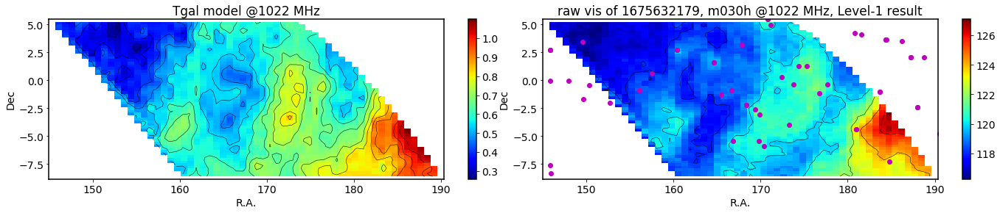

In [77]:
plot_gsize=60
plt.figure(figsize=(24,4))
plt.subplots_adjust(wspace=0,hspace=0.3)
plt.subplot(121)
p_data=gal[nd_s0,ch_plot]
kv.plot_data(ra[nd_s0],dec[nd_s0], p_data,gsize=60)
plt.xlabel('R.A.')
plt.ylabel('Dec')
plt.title('Tgal model @'+str(round(freqs[ch_plot]/1e6))+' MHz')
plt.subplot(122)
p_data=vis_clean[nd_s0,ch_plot]
kv.plot_mdata(ra[nd_s0],dec[nd_s0], p_data,gsize=plot_gsize,  grid_method='linear', levels=6, x_mask=1, y_mask=2)
#kv.plot_data(ra[nd_s0],dec[nd_s0], p_data,gsize=60)
plt.title('raw vis of '+str(fname)+', '+str(recv)+ ' @'+ str(round(freqs[ch_plot]/1e6)) +' MHz, Level-1 result')
plt.xlabel('R.A.')
plt.ylabel('Dec')
plt.plot(p_radec[:,0],p_radec[:,1],'mo')
plt.show()

<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>


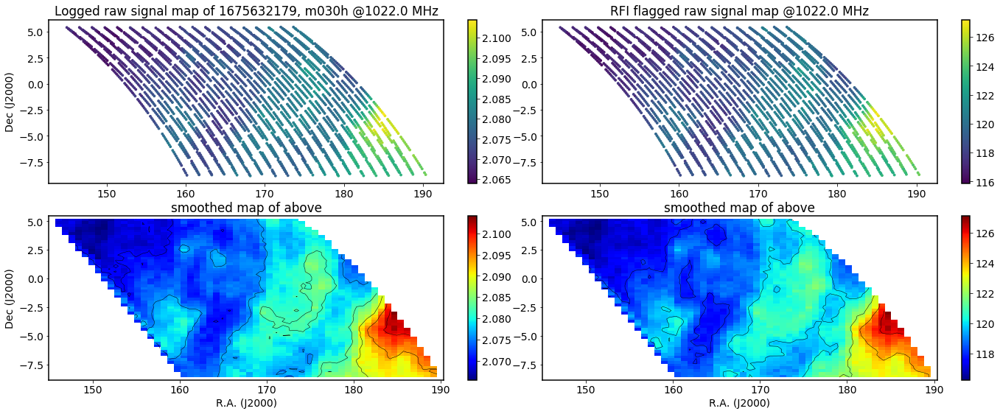

In [78]:
#raw map in different resolution
plt.figure(figsize=(24,9))
plt.subplots_adjust(wspace=0.,hspace=.2)
plt.subplot(221)
p_data=np.ma.log10(vis_backup[nd_s0,ch_plot])
plt.scatter(ra[nd_s0],dec[nd_s0], c=p_data, s=8)
plt.title('Logged raw signal map of '+str(fname)+', '+str(recv)+ ' @'+ str(round(freqs[ch_plot]/1e6,0))+' MHz')
#plt.xlabel('R.A. (J2000)')
plt.ylabel('Dec (J2000)')
clb = plt.colorbar()
plt.subplot(222)
p_data=vis_clean[nd_s0,ch_plot]
plt.scatter(ra[nd_s0],dec[nd_s0], c=p_data, s=8)
plt.title('RFI flagged raw signal map @'+ str(round(freqs[ch_plot]/1e6,0))+' MHz')
#plt.xlabel('R.A. (J2000)')
#plt.ylabel('Dec (J2000)')
clb = plt.colorbar()
plt.subplot(223)
p_data=np.ma.array(np.ma.log10(vis_backup[nd_s0,ch_plot]),mask=False) #for plot_mdata mask
kv.plot_mdata(ra[nd_s0],dec[nd_s0], p_data,gsize=plot_gsize,  grid_method='linear', levels=6, x_mask=1, y_mask=2)
#plt.plot(p_radec[:,0],p_radec[:,1],'mo')
plt.title('smoothed map of above')
plt.xlabel('R.A. (J2000)')
plt.ylabel('Dec (J2000)')
plt.subplot(224)
p_data=vis_clean[nd_s0,ch_plot]
kv.plot_mdata(ra[nd_s0],dec[nd_s0], p_data,gsize=plot_gsize,  grid_method='linear', levels=6, x_mask=1, y_mask=2)
#plt.plot(p_radec[:,0],p_radec[:,1],'mo')
plt.title('smoothed map of above')
plt.xlabel('R.A. (J2000)')
#plt.ylabel('Dec (J2000)')
plt.savefig(output_file+'F_'+fname+'_'+recv+'_rfi_comp_map.png', bbox_inches='tight')
plt.show()

In [79]:
d={}
d['mask']=vis_clean.mask
fs=open(output_file+fname+'_'+str(recv)+'_mask','wb')
pickle.dump(d,fs,protocol=2)
fs.close()


In [80]:
print ('end @ ' + time.asctime(time.localtime(time.time())) +'#')

end @ Thu Nov 21 16:40:48 2024#


In [81]:
#end

## Check the final mask 
## (mask_h and mask_v are both required)

In [82]:
#get vis
recv1=ant+'h'
recv2=ant+'v'

In [83]:
vis_h,flags_h= kio.call_vis(fname,recv1)
vis_v,flags_v= kio.call_vis(fname,recv2)

['m030h' 'm030h']
['m030v' 'm030v']


In [84]:
'''
data_h = pickle.load(open('/idia/projects/hi_im/raw_vis/SCI-20210212-MS-01/'+str(fname)+'/'+str(fname)+'_'+str(recv1)+'_vis_data','rb'))
vis_h=data_h['vis']
flags_h=data_h['flags']

data_v = pickle.load(open('/idia/projects/hi_im/raw_vis/SCI-20210212-MS-01/'+str(fname)+'/'+str(fname)+'_'+str(recv2)+'_vis_data','rb'))
vis_v=data_v['vis']
flags_v=data_v['flags']
'''

"\ndata_h = pickle.load(open('/idia/projects/hi_im/raw_vis/SCI-20210212-MS-01/'+str(fname)+'/'+str(fname)+'_'+str(recv1)+'_vis_data','rb'))\nvis_h=data_h['vis']\nflags_h=data_h['flags']\n\ndata_v = pickle.load(open('/idia/projects/hi_im/raw_vis/SCI-20210212-MS-01/'+str(fname)+'/'+str(fname)+'_'+str(recv2)+'_vis_data','rb'))\nvis_v=data_v['vis']\nflags_v=data_v['flags']\n"

In [85]:

#get mask
d1 = pickle.load(open(output_file+fname+'_'+ant+'h_mask','rb'))
mask_h=d1['mask']
d2 = pickle.load(open(output_file+fname+'_'+ant+'v_mask','rb'))
mask_v=d2['mask']
#vis_clean
vis_clean_h=np.ma.array(vis_h,mask=mask_h)
vis_clean_v=np.ma.array(vis_v,mask=mask_v)
print (np.ma.mean(vis_clean_h),np.ma.mean(vis_clean_v))
#get intersection mask
vis_div=vis_clean_h/vis_clean_v #intersection mask
vis_div=kr.clean_bad_ratio(vis_div,ratio_t=0.6,ratio_ch=0.5) #clean bad ratio part
#update vis_clean
vis_clean_hh=np.ma.array(vis_clean_h,mask=vis_div.mask)
vis_clean_vv=np.ma.array(vis_clean_v,mask=vis_div.mask)
print (np.ma.mean(vis_clean_hh),np.ma.mean(vis_clean_vv))

202.81510565815964 221.65484079513996
203.02671248734876 221.74288739252043


In [86]:
np.shape(np.where(vis_div.mask==True))

(2, 6127130)

In [87]:
mask_ratio_final=np.shape(np.where(vis_div.mask==True))[1]/np.shape(vis_div)[0]/np.shape(vis_div)[1]
print ('# final mask ratio of '+ant+': '+ str(mask_ratio_final))

# final mask ratio of m030: 0.30441215866020555


In [88]:
d={}
d['mask']=vis_div.mask
fs=open(output_file+fname+'_'+str(ant)+'_mask','wb')
pickle.dump(d,fs,protocol=2)
fs.close()


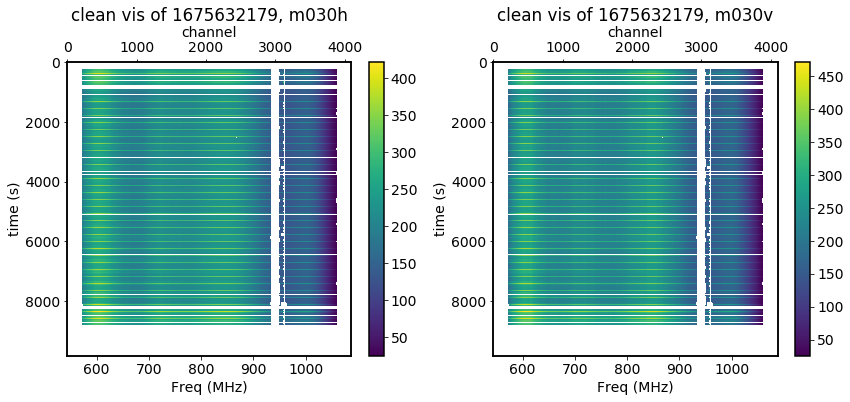

In [89]:
plt.figure(figsize=(14,5.4))
plt.subplot(121)

plt.imshow(vis_clean_hh,aspect='auto',extent=(data.freqs[0]/1e6,data.freqs[-1]/1e6,len(timestamps)*2,0))
plt.xlabel('Freq (MHz)')
plt.ylabel('time (s)')

plt.title('clean vis of '+str(fname)+', '+str(ant)+'h', y=1.12)
plt.colorbar()
plt.twiny()
plt.imshow(vis_clean_hh,aspect='auto',extent=(0,len(data.freqs),len(timestamps)*2,0))
plt.xlabel('channel')

plt.subplot(122)

plt.imshow(vis_clean_vv,aspect='auto',extent=(data.freqs[0]/1e6,data.freqs[-1]/1e6,len(timestamps)*2,0))
plt.xlabel('Freq (MHz)')
plt.ylabel('time (s)')

plt.title('clean vis of '+str(fname)+', '+str(ant)+'v', y=1.12)
plt.colorbar()
plt.twiny()
plt.imshow(vis_clean_vv,aspect='auto',extent=(0,len(data.freqs),len(timestamps)*2,0))
plt.xlabel('channel')

#plt.savefig(str(fname)+'raw_vis.pdf', bbox_inches='tight')
plt.savefig(output_file+str(fname)+'_'+ant+'_clean_vis.png', bbox_inches='tight')
plt.show()


In [90]:
#show channel changes

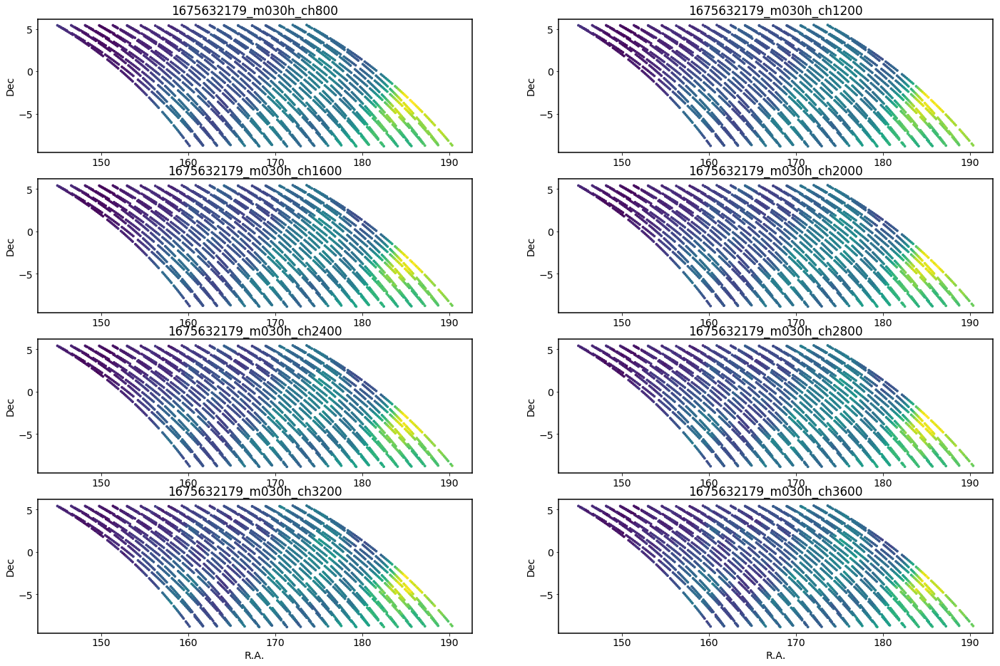

<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>


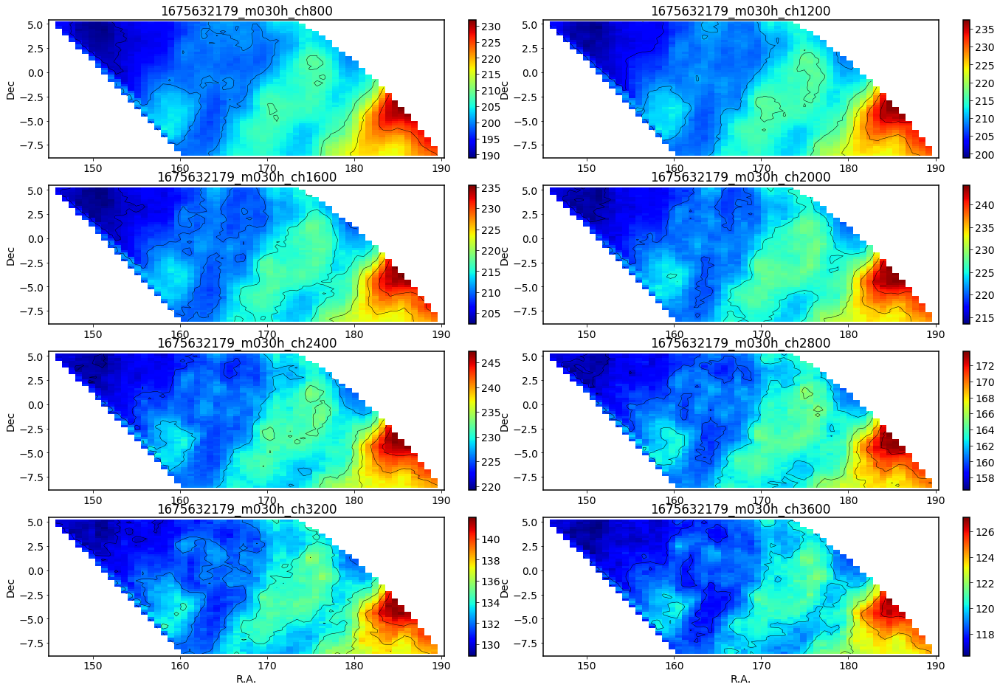

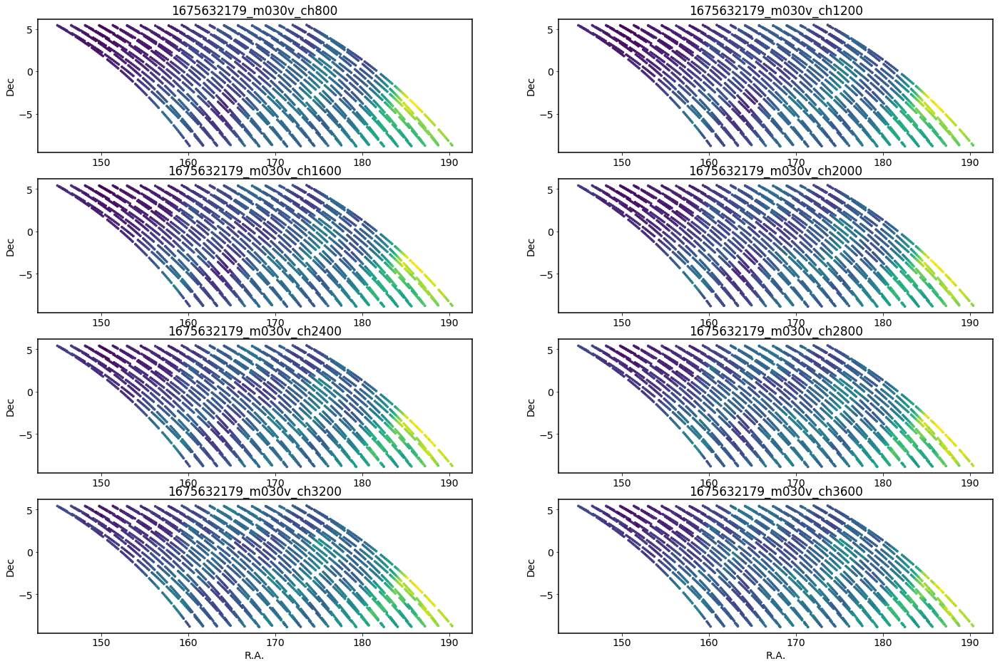

<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>
<class 'numpy.ma.core.MaskedArray'>


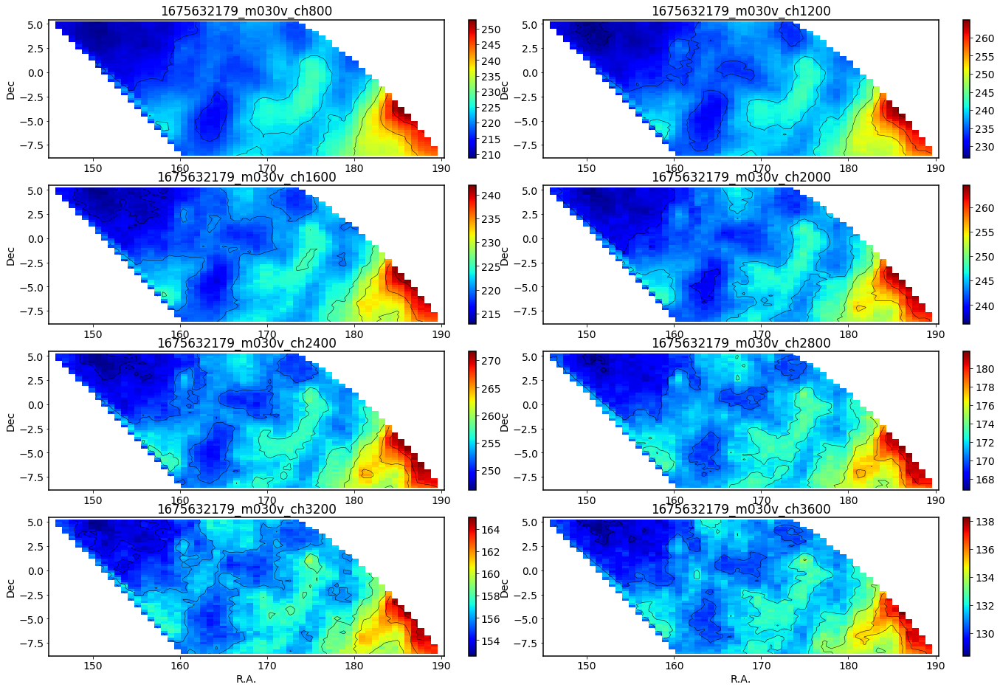

In [91]:
for pol in ['h','v']:
    recv=ant+pol
    if pol=='h':
        vis_clean_pol=vis_clean_hh
    if pol=='v':
        vis_clean_pol=vis_clean_vv
        
    plt.figure(figsize=(24,20))
    for i in range(len(ch_plot_list)):
        ch_plot1=ch_plot_list[i]
        p_data=vis_clean_pol[nd_s0,ch_plot1]
        plt.subplot(5,2,i+1)
        plt.scatter(ra[nd_s0],dec[nd_s0], c=p_data, vmin=p_data.min(),vmax=p_data.max(), s=8)
        if i>len(ch_plot_list)-3:
            plt.xlabel('R.A.')
        plt.ylabel('Dec')
        plt.title(fname+'_'+recv+'_ch'+str(ch_plot1))
        #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
    plt.savefig(output_file+fname+'_'+recv+'_scatter_map.png')
    plt.show()

    plt.figure(figsize=(24,20))
    plt.subplots_adjust(wspace =0)
    for i in range(len(ch_plot_list)):
        ch_plot1=ch_plot_list[i]
        p_data=vis_clean_pol[nd_s0,ch_plot1]
        plt.subplot(5,2,i+1)
        #kv.plot_data(ra[nd_s0],dec[nd_s0], p_data,gsize=60)
        kv.plot_mdata(ra[nd_s0],dec[nd_s0], p_data,gsize=plot_gsize,  grid_method='linear', levels=6, x_mask=1, y_mask=2)
        #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
        if i>len(ch_plot_list)-3:
            plt.xlabel('R.A.')
        plt.ylabel('Dec')
        plt.title(fname+'_'+recv+'_ch'+str(ch_plot1))
        #plt.plot(p_radec[:,0],p_radec[:,1],'mo')
    plt.savefig(output_file+fname+'_'+recv+'_map.png')
    plt.show()

In [92]:
#END of Level 1 

In [93]:
print ('end @ ' + time.asctime(time.localtime(time.time())) +'#')

end @ Thu Nov 21 16:41:14 2024#
